In [199]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import confusion_matrix
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from collections import Counter
import dalex as dx
import eli5
from eli5.sklearn import PermutationImportance
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import random

In [8]:
churn_data=pd.read_csv("Telco-Customer-Churn.csv")
churn_data.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [9]:
churn_data.shape

(7043, 21)

In [10]:
churn_data.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [11]:
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [12]:
churn_data['TotalCharges'] = pd.to_numeric(churn_data['TotalCharges'], errors='coerce')
churn_data["SeniorCitizen"]= churn_data["SeniorCitizen"].map({0: "No", 1: "Yes"})

In [13]:
numerical_col=churn_data.select_dtypes(include=np.number).columns
print("numerical columns: \n",numerical_col)

categorical_col=churn_data.select_dtypes(exclude=np.number).columns
print("categorical columns: \n",categorical_col)

numerical columns: 
 Index(['tenure', 'MonthlyCharges', 'TotalCharges'], dtype='object')
categorical columns: 
 Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'Churn'],
      dtype='object')


In [14]:
churn_data.drop('customerID',axis=1,inplace=True)

In [15]:
numerical_data=churn_data[['TotalCharges','MonthlyCharges','tenure']]
numerical_data['TotalCharges'].isnull().sum()

11

In [16]:
numerical_data['tenure'].isin([0]).sum()

11

In [17]:
churn_data.loc[:,'TotalCharges'] = churn_data.loc[:,'TotalCharges'].replace(np.nan,0)
churn_data['TotalCharges'].isnull().sum()

0

In [18]:
churn_data=churn_data.replace(to_replace={'Churn':{'Yes':1,'No':0}})

In [19]:
for columns in churn_data.select_dtypes('object').columns:
    print(columns,": \n")
    print(churn_data[columns].value_counts(),"\n")

gender : 

Male      3555
Female    3488
Name: gender, dtype: int64 

SeniorCitizen : 

No     5901
Yes    1142
Name: SeniorCitizen, dtype: int64 

Partner : 

No     3641
Yes    3402
Name: Partner, dtype: int64 

Dependents : 

No     4933
Yes    2110
Name: Dependents, dtype: int64 

PhoneService : 

Yes    6361
No      682
Name: PhoneService, dtype: int64 

MultipleLines : 

No                  3390
Yes                 2971
No phone service     682
Name: MultipleLines, dtype: int64 

InternetService : 

Fiber optic    3096
DSL            2421
No             1526
Name: InternetService, dtype: int64 

OnlineSecurity : 

No                     3498
Yes                    2019
No internet service    1526
Name: OnlineSecurity, dtype: int64 

OnlineBackup : 

No                     3088
Yes                    2429
No internet service    1526
Name: OnlineBackup, dtype: int64 

DeviceProtection : 

No                     3095
Yes                    2422
No internet service    1526
Name: Devi

In [20]:
churn_data.describe()

,tenure,MonthlyCharges,TotalCharges,Churn
count,7043.000000,7043.000000,7043.000000,7043.000000
mean,32.371149,64.761692,2279.734304,0.265370
std,24.559481,30.090047,2266.794470,0.441561
min,0.000000,18.250000,0.000000,0.000000
25%,9.000000,35.500000,398.550000,0.000000
50%,29.000000,70.350000,1394.550000,0.000000
75%,55.000000,89.850000,3786.600000,1.000000
max,72.000000,118.750000,8684.800000,1.000000


In [21]:
x=churn_data.drop('Churn',axis=1)
x.head(2)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,Female,No,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85
1,Male,No,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50


In [22]:
y=churn_data['Churn']

In [23]:
x.dtypes

gender               object
SeniorCitizen        object
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
dtype: object

In [24]:
multi_cat=[]
Binary_cat=[]
for columns in x.select_dtypes('object').columns:
    #print(columns,": \n")
    if (x[columns].nunique() > 2):
        multi_cat.append(columns)
    else: 
        Binary_cat.append(columns)
          
print(Binary_cat)  
print(multi_cat)

['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService', 'PaperlessBilling']
['MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract', 'PaymentMethod']


In [25]:
le = LabelEncoder()
for i in Binary_cat:
  x[i] = le.fit_transform(x[i])

In [26]:
x=pd.get_dummies(x, columns=multi_cat)
x

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,PaperlessBilling,MonthlyCharges,TotalCharges,MultipleLines_No,...,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaymentMethod_Bank transfer (automatic),PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,0,1,0,1,0,1,29.85,29.85,0,...,1,0,0,1,0,0,0,0,1,0
1,1,0,0,0,34,1,0,56.95,1889.50,1,...,1,0,0,0,1,0,0,0,0,1
2,1,0,0,0,2,1,1,53.85,108.15,1,...,1,0,0,1,0,0,0,0,0,1
3,1,0,0,0,45,0,0,42.30,1840.75,0,...,1,0,0,0,1,0,1,0,0,0
4,0,0,0,0,2,1,1,70.70,151.65,1,...,1,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1,0,1,1,24,1,1,84.80,1990.50,0,...,0,0,1,0,1,0,0,0,0,1
7039,0,0,1,1,72,1,1,103.20,7362.90,0,...,0,0,1,0,1,0,0,1,0,0
7040,0,0,1,1,11,0,1,29.60,346.45,0,...,1,0,0,1,0,0,0,0,1,0
7041,1,1,1,0,4,1,1,74.40,306.60,0,...,1,0,0,1,0,0,0,0,0,1


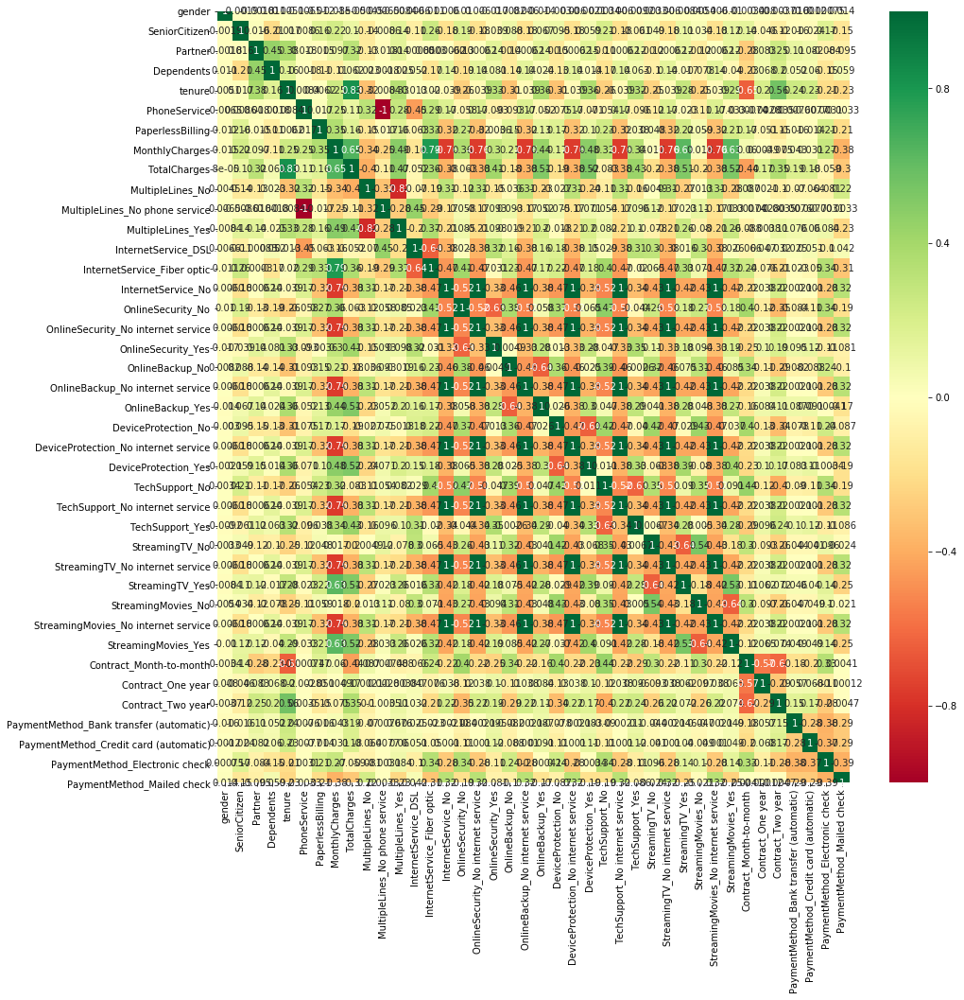

In [27]:
plt.figure(figsize=(15,15))
p=sns.heatmap(x.corr(),annot=True,cmap='RdYlGn',center=0)

In [28]:
x.drop(columns=['StreamingTV_No internet service','StreamingMovies_No internet service',
      'TechSupport_No internet service','DeviceProtection_No internet service',
      'OnlineBackup_No internet service','OnlineSecurity_No internet service',
      'InternetService_No','MultipleLines_No phone service'],inplace=True)

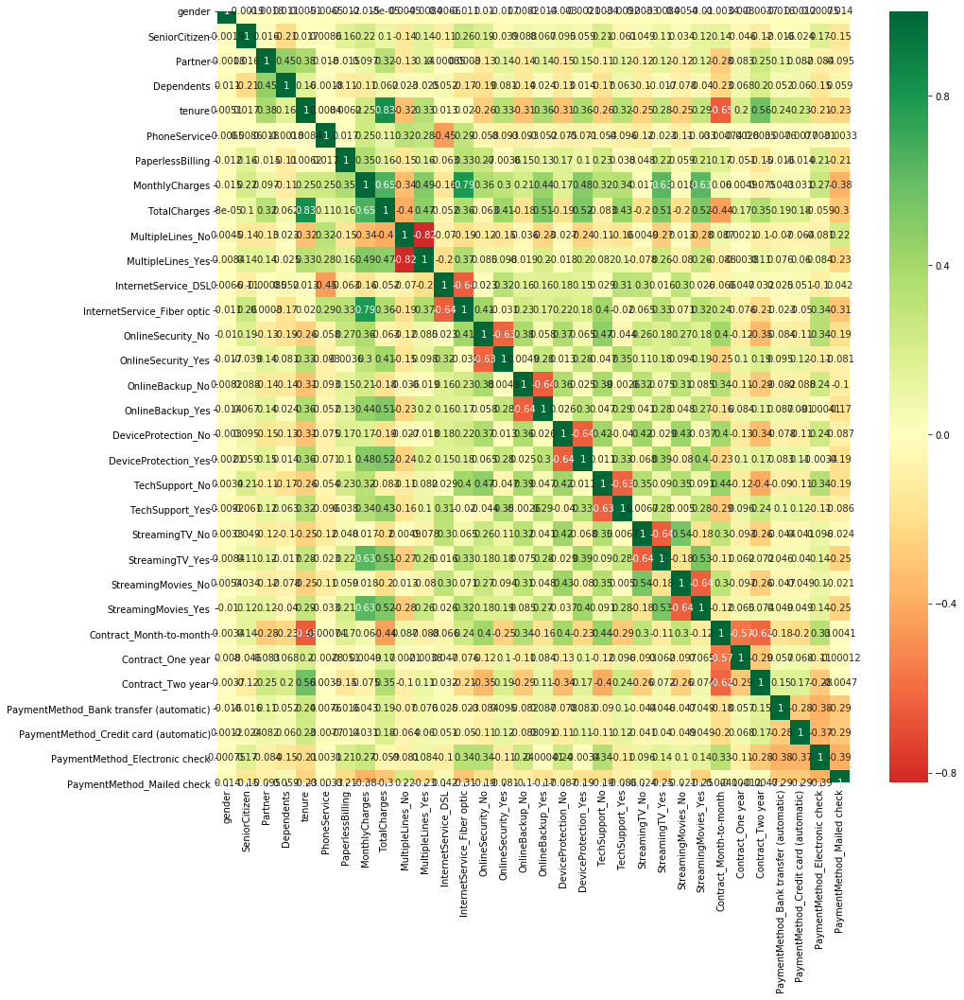

In [29]:
plt.figure(figsize=(15,15))
p=sns.heatmap(x.corr(),annot=True,cmap='RdYlGn',center=0)

In [30]:
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=99)

In [31]:
ct = ColumnTransformer([

        ('somename', StandardScaler(), ['tenure', 'MonthlyCharges', 'TotalCharges'])

    ], remainder='passthrough')

In [32]:
y_train.count()

4930

In [33]:
y_test.value_counts()

0    1552
1     561
Name: Churn, dtype: int64

# Logistic regression

In [34]:
clf_log= Pipeline([('transformer', ct),
                ('classifier', LogisticRegression())
               ])
clf_log.fit(X_train,y_train)
y_predict=clf_log.predict(X_test)


print ("Accuracy: \n",metrics.accuracy_score(y_test,y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test,y_predict))
print("\n classification report: \n",metrics.classification_report(y_test,y_predict))

Accuracy: 
 0.8031235210601041

 confusion_matrix: 
 [[1400  152]
 [ 264  297]]

 classification report: 
               precision    recall  f1-score   support

           0       0.84      0.90      0.87      1552
           1       0.66      0.53      0.59       561

    accuracy                           0.80      2113
   macro avg       0.75      0.72      0.73      2113
weighted avg       0.79      0.80      0.80      2113



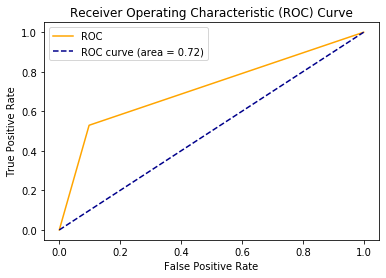

In [35]:
auc=roc_auc_score(y_test, y_predict)
fpr, tpr,thresholds = roc_curve(y_test, y_predict)
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

In [36]:
clf_log= Pipeline([('transformer', ct),
                ('classifier', LogisticRegression(class_weight="balanced"))
               ])
clf_log.fit(X_train,y_train)
y_predict=clf_log.predict(X_test)
print ("Accuracy: \n",metrics.accuracy_score(y_test,y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test,y_predict))
print("\n classification report: \n",metrics.classification_report(y_test,y_predict))
print(y_train.value_counts())

Accuracy: 
 0.7496450544249882

 confusion_matrix: 
 [[1132  420]
 [ 109  452]]

 classification report: 
               precision    recall  f1-score   support

           0       0.91      0.73      0.81      1552
           1       0.52      0.81      0.63       561

    accuracy                           0.75      2113
   macro avg       0.72      0.77      0.72      2113
weighted avg       0.81      0.75      0.76      2113

0    3622
1    1308
Name: Churn, dtype: int64


class imbalance

0    5174
1    1869
Name: Churn, dtype: int64


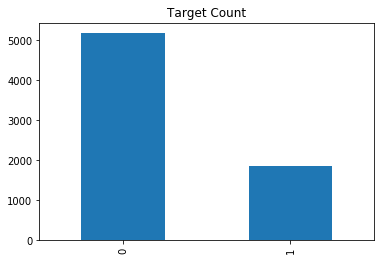

In [37]:
target=y.value_counts()
print(target)
target.plot(kind='bar', title='Target Count');

In [38]:
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler()
X_rus, y_rus = ros.fit_resample(x, y)
X_train_rus,X_test_rus,y_train_rus,y_test_rus=train_test_split(X_rus, y_rus,test_size=0.3,
                                                               random_state=99)
clf_log.fit(X_train_rus,y_train_rus)
y_predict_rus=clf_log.predict(X_test_rus)

print(y_train_rus.shape,y_test_rus.shape)
print("original shape",Counter(y))
print("random under sampled shape",Counter(y_rus))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_rus,y_predict_rus))
print("Accuracy score:",metrics.accuracy_score(y_test_rus, y_predict_rus))
print("classification_report:\n",metrics.classification_report(y_test_rus, y_predict_rus))

(2616,) (1122,)
original shape Counter({0: 5174, 1: 1869})
random under sampled shape Counter({0: 1869, 1: 1869})

 confusion_matrix: 
 [[419 146]
 [118 439]]
Accuracy score: 0.7647058823529411
classification_report:
               precision    recall  f1-score   support

           0       0.78      0.74      0.76       565
           1       0.75      0.79      0.77       557

    accuracy                           0.76      1122
   macro avg       0.77      0.76      0.76      1122
weighted avg       0.77      0.76      0.76      1122



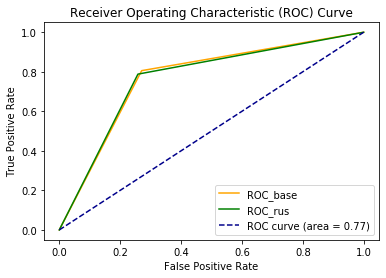

In [39]:
auc=roc_auc_score(y_test, y_predict)
fpr1, tpr1,thresholds1 = roc_curve(y_test, y_predict)
fpr2, tpr2,thresholds2 = roc_curve(y_test_rus, y_predict_rus)
plt.plot(fpr1, tpr1, color='orange', label='ROC_base')
plt.plot(fpr2, tpr2, color='green', label='ROC_rus')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

In [40]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler()
X_ros, y_ros = ros.fit_resample(x, y)
X_train_ros,X_test_ros,y_train_ros,y_test_ros=train_test_split(X_ros, y_ros,test_size=0.3,
                                                               random_state=99)
clf_log.fit(X_train_ros,y_train_ros)
y_predict_ros=clf_log.predict(X_test_ros)

print(y_train_ros.shape,y_test_ros.shape)
print("original shape",Counter(y))
print("random over sampled shape",Counter(y_ros))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_ros,y_predict_ros))
print("Accuracy score:",metrics.accuracy_score(y_test_ros, y_predict_ros))
print("classification_report:\n",metrics.classification_report(y_test_ros, y_predict_ros))
#_, ax = plt.subplots(figsize=(6, 6))
#ax.scatter(X_ros.iloc[:, 0], X_ros.iloc[:, 1], c=y_ros,alpha=0.8, edgecolor="k")

(7243,) (3105,)
original shape Counter({0: 5174, 1: 1869})
random over sampled shape Counter({0: 5174, 1: 5174})

 confusion_matrix: 
 [[1119  415]
 [ 295 1276]]
Accuracy score: 0.7713365539452496
classification_report:
               precision    recall  f1-score   support

           0       0.79      0.73      0.76      1534
           1       0.75      0.81      0.78      1571

    accuracy                           0.77      3105
   macro avg       0.77      0.77      0.77      3105
weighted avg       0.77      0.77      0.77      3105



original shape Counter({0: 5174, 1: 1869})
SMOTE sampled shape Counter({0: 5174, 1: 5174})
(7243,) (3105,)
Accuracy score: 0.8460547504025765

 confusion_matrix: 
 [[1311  223]
 [ 255 1316]]
classification_report:
               precision    recall  f1-score   support

           0       0.84      0.85      0.85      1534
           1       0.86      0.84      0.85      1571

    accuracy                           0.85      3105
   macro avg       0.85      0.85      0.85      3105
weighted avg       0.85      0.85      0.85      3105



C:\Users\hp\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


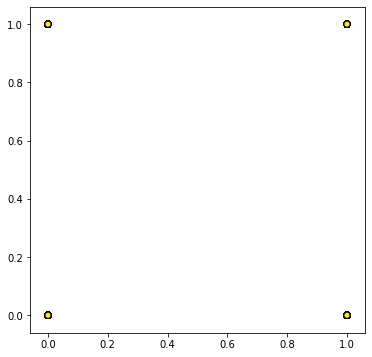

In [41]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state = 2)
X_sm, y_sm = sm.fit_resample(x,y)
X_train_sm,X_test_sm,y_train_sm,y_test_sm=train_test_split(X_sm, y_sm,test_size=0.3,random_state=99)
clf_log.fit(X_train_sm,y_train_sm)
y_predict_sm=clf_log.predict(X_test_sm)

print("original shape",Counter(y))
print("SMOTE sampled shape",Counter(y_sm))
print(y_train_sm.shape,y_test_sm.shape)
print("Accuracy score:",metrics.accuracy_score(y_test_sm, y_predict_sm))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_sm, y_predict_sm))
print("classification_report:\n",metrics.classification_report(y_test_sm, y_predict_sm))

_, ax = plt.subplots(figsize=(6, 6))
ax.scatter(X_sm.iloc[:, 0], X_sm.iloc[:, 1], c=y_sm,alpha=0.8, edgecolor="k")

In [42]:
from imblearn.over_sampling import ADASYN
ada=ADASYN()
X_ada, y_ada = ada.fit_resample(x,y)
X_train_ada,X_test_ada,y_train_ada,y_test_ada=train_test_split(X_ada, y_ada,test_size=0.3,random_state=99)
clf_log.fit(X_train_ada,y_train_ada)
y_predict_ada=clf_log.predict(X_test_ada)

print("original shape",Counter(y))
print("ADASYN sampled shape",Counter(y_ada))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_ada, y_predict_ada))
print("Accuracy score:",metrics.accuracy_score(y_test_ada, y_predict_ada))
print("classification_report:\n",metrics.classification_report(y_test_ada, y_predict_ada))

original shape Counter({0: 5174, 1: 1869})
ADASYN sampled shape Counter({1: 5234, 0: 5174})

 confusion_matrix: 
 [[1352  186]
 [ 268 1317]]
Accuracy score: 0.8546269612552033
classification_report:
               precision    recall  f1-score   support

           0       0.83      0.88      0.86      1538
           1       0.88      0.83      0.85      1585

    accuracy                           0.85      3123
   macro avg       0.86      0.85      0.85      3123
weighted avg       0.86      0.85      0.85      3123



C:\Users\hp\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [43]:
d = {'feature': X_train_sm.columns, 'coefficient': clf_log['classifier'].coef_[0], 'odds': np.exp(clf_log['classifier'].coef_[0])}
df = pd.DataFrame(data=d)
df.sort_values(by='odds', ascending=False)

,feature,coefficient,odds
1,SeniorCitizen,3.953010,52.091953
11,InternetService_DSL,1.861676,6.434511
2,Partner,1.086247,2.963132
8,TotalCharges,0.194777,1.215040
4,tenure,0.061455,1.063383
5,PhoneService,-0.125678,0.881899
3,Dependents,-0.162797,0.849764
6,PaperlessBilling,-0.357393,0.699498
23,StreamingMovies_No,-0.418846,0.657806
21,StreamingTV_No,-0.618495,0.538755


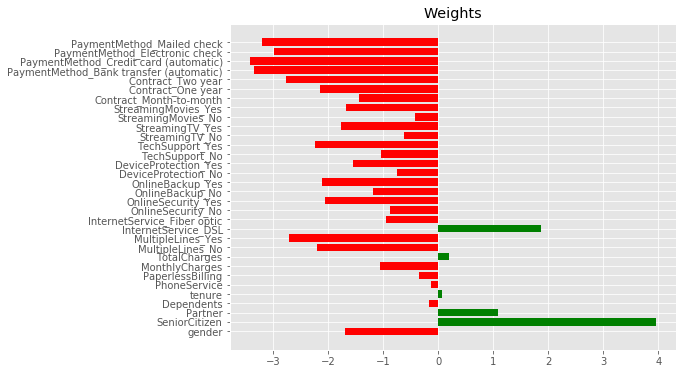

In [166]:
with plt.style.context("ggplot"):
    fig = plt.figure(figsize=(8,6))
    plt.barh(range(len(clf_log['classifier'].coef_[0])), clf_log['classifier'].coef_[0], color=["red" if coef<0 else "green" for coef in clf_log['classifier'].coef_[0]])
    plt.yticks(range(len(clf_log['classifier'].coef_[0])), X_train_sm.columns);
    plt.title("Weights")

In [243]:
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_sm),
    feature_names=X_train_sm.columns,
    mode='classification',
    class_names=['non-churn', 'churn']
)

In [244]:
i=105
print("Actual:",y_test_sm.iloc[i])
exp = explainer.explain_instance(
    data_row=X_test_sm.iloc[i],
    predict_fn=clf_log['classifier'].predict_proba
)
exp.show_in_notebook(show_table=True)

Actual: 1


In [250]:
import shap
shap.initjs()
shap_explainer = shap.LinearExplainer(clf_log['classifier'],masker=shap.maskers.Impute(data=X_train_sm))
shap_values = shap_explainer(X_test_sm)

Estimating transforms:   0%|          | 0/1000 [00:00<?, ?it/s]

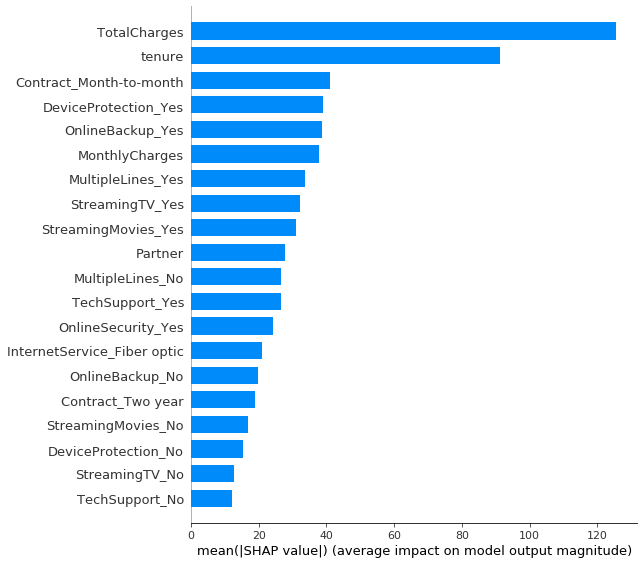

In [251]:
shap.summary_plot(shap_values, X_test_sm, plot_type="bar")

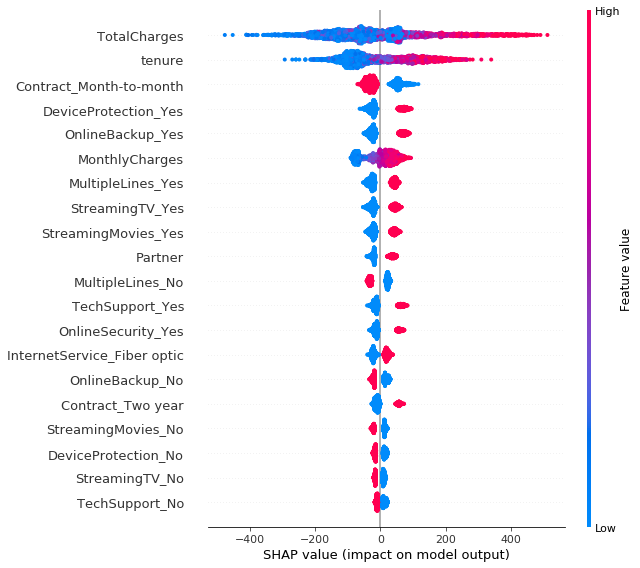

In [252]:
shap.summary_plot(shap_values, X_test_sm)

In [253]:
shap.plots.force(shap_values[0])

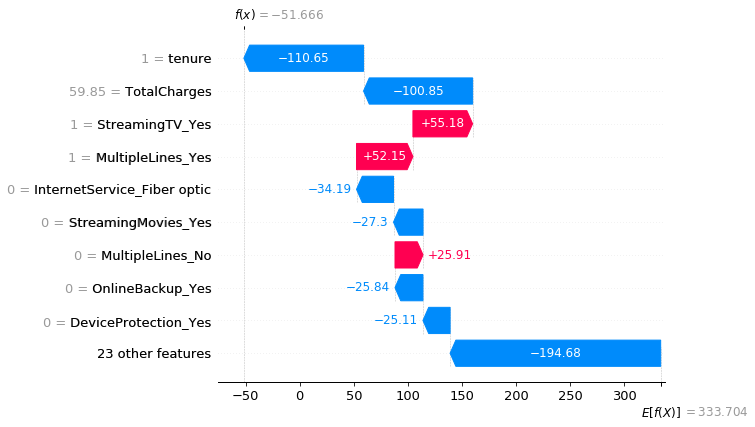

In [254]:
shap.plots.waterfall(shap_values[0])

In [64]:
import dalex as dx

In [65]:
def protected_values(X):
    x_new=X.copy()
    y_new=X.copy()
    x_new['gender']=x_new['gender'].map({0: "female", 1: "male"})
    y_new['SeniorCitizen']=y_new['SeniorCitizen'].map({0: "young", 1: "old"})
    protected=x_new['gender']+y_new['SeniorCitizen']
    return protected;

In [66]:
exp_logreg = dx.Explainer(clf_log,x,y)
exp_logreg.model_performance().result

Preparation of a new explainer is initiated

  -> data              : 7043 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 7043 values
  -> model_class       : sklearn.linear_model._logistic.LogisticRegression (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.00103, mean = 0.291, max = 0.863
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.826, mean = -0.0261, max = 0.997
  -> model_info        : package sklearn

A new explainer has been created!


,recall,precision,f1,accuracy,auc
LogisticRegression,0.593365,0.624437,0.608505,0.797387,0.841177


In [372]:
fobject_logreg = exp_logreg.model_fairness(protected = protected_values(x), privileged='maleyoung')
fobject_logreg.result
fobject_logreg.fairness_check(epsilon = 0.8)

Bias detected in 3 metrics: TPR, FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceeded acceptable limits set by epsilon.

Ratios of metrics, based on 'maleyoung'. Parameter 'epsilon' was set to 0.8 and therefore metrics should be within (0.8, 1.25)
                  TPR       ACC       PPV       FPR       STP
femaleold    1.388889  0.884521  1.049919  2.927835  2.397959
femaleyoung  1.137931  0.991400  0.961353  1.298969  1.214286
maleold      1.281609  0.905405  1.101449  2.226804  2.051020


In [373]:
fobject_logreg.metric_scores

,TPR,TNR,PPV,NPV,FNR,FPR,FDR,FOR,ACC,STP
femaleold,0.725,0.716,0.652,0.781,0.275,0.284,0.348,0.219,0.720,0.470
femaleyoung,0.594,0.874,0.597,0.872,0.406,0.126,0.403,0.128,0.807,0.238
maleold,0.669,0.784,0.684,0.773,0.331,0.216,0.316,0.227,0.737,0.402
maleyoung,0.522,0.903,0.621,0.862,0.478,0.097,0.379,0.138,0.814,0.196


In [374]:
fobject_logreg.plot()

In [400]:
exp_logreg_rus = dx.Explainer(clf_log,X_rus,y_rus)
exp_logreg_rus.model_performance().result
fobject_logreg_rus = exp_logreg_rus.model_fairness(protected = protected_values(X_rus), privileged='maleyoung')
fobject_logreg_rus.fairness_check(epsilon = 0.8)
fobject_logreg_rus.metric_scores
fobject_logreg_rus.plot()
exp_logreg_rus.model_performance().result

Preparation of a new explainer is initiated

  -> data              : 3738 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 3738 values
  -> model_class       : sklearn.linear_model._logistic.LogisticRegression (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.00114, mean = 0.363, max = 0.861
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.805, mean = 0.137, max = 0.997
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 3 metrics: TPR, FPR, STP

Conclusion: your model is not fair because 2 o

,recall,precision,f1,accuracy,auc
LogisticRegression,0.588015,0.824456,0.686446,0.731407,0.843261


In [401]:
exp_logreg_ros = dx.Explainer(clf_log,X_ros,y_ros)
exp_logreg_ros.model_performance().result
fobject_logreg_ros = exp_logreg_ros.model_fairness(protected = protected_values(X_ros), privileged='maleyoung')
fobject_logreg_ros.fairness_check(epsilon = 0.8)
fobject_logreg_ros.metric_scores
fobject_logreg_ros.plot()
exp_logreg_ros.model_performance().result

Preparation of a new explainer is initiated

  -> data              : 10348 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10348 values
  -> model_class       : sklearn.linear_model._logistic.LogisticRegression (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.00105, mean = 0.361, max = 0.861
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.823, mean = 0.139, max = 0.997
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 3 metrics: TPR, FPR, STP

Conclusion: your model is not fair because 2

,recall,precision,f1,accuracy,auc
LogisticRegression,0.577696,0.818456,0.677317,0.724778,0.837409


In [402]:
exp_logreg_sm = dx.Explainer(clf_log,X_sm,y_sm)
exp_logreg_sm.model_performance().result
fobject_logreg_sm = exp_logreg_sm.model_fairness(protected = protected_values(X_sm), privileged='maleyoung')
fobject_logreg_sm.fairness_check(epsilon = 0.8)
fobject_logreg_sm.metric_scores
fobject_logreg_sm.plot()
exp_logreg_sm.model_performance().result

Preparation of a new explainer is initiated

  -> data              : 10348 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10348 values
  -> model_class       : sklearn.linear_model._logistic.LogisticRegression (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.00105, mean = 0.494, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.823, mean = 0.00561, max = 0.997
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or m

,recall,precision,f1,accuracy,auc
LogisticRegression,0.828952,0.866115,0.847126,0.850406,0.935858


In [403]:
exp_logreg_ada = dx.Explainer(clf_log,X_ada,y_ada)
exp_logreg_ada.model_performance().result
fobject_logreg_ada = exp_logreg_ada.model_fairness(protected = protected_values(X_ada), privileged='maleyoung')
fobject_logreg_ada.fairness_check(epsilon = 0.8)
fobject_logreg_ada.metric_scores
fobject_logreg_ada.plot()
exp_logreg_ada.model_performance().result

Preparation of a new explainer is initiated

  -> data              : 10408 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10408 values
  -> model_class       : sklearn.linear_model._logistic.LogisticRegression (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.00105, mean = 0.499, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.823, mean = 0.00419, max = 0.997
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or m

,recall,precision,f1,accuracy,auc
LogisticRegression,0.823653,0.866707,0.844632,0.847617,0.935331


# Decision tree 

In [76]:
from sklearn.tree import DecisionTreeClassifier
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=0)
clf_decision = Pipeline([('transformer', ct),
                ('classifier', DecisionTreeClassifier())
               ])
clf_decision.fit(X_train,y_train)
y_predict_dt=clf_decision.predict(X_test)

print ("Accuracy: \n",metrics.accuracy_score(y_test,y_predict_dt))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test,y_predict_dt,labels = [0, 1]))
print("\n classification report: \n",metrics.classification_report(y_test,y_predict_dt,labels = [0, 1]))

Accuracy: 
 0.7193563653573118

 confusion_matrix: 
 [[1251  309]
 [ 284  269]]

 classification report: 
               precision    recall  f1-score   support

           0       0.81      0.80      0.81      1560
           1       0.47      0.49      0.48       553

    accuracy                           0.72      2113
   macro avg       0.64      0.64      0.64      2113
weighted avg       0.72      0.72      0.72      2113



In [77]:
from sklearn import tree
text_representation = tree.export_text(clf_decision['classifier'])
print(text_representation)

|--- feature_25 <= 0.50
|   |--- feature_1 <= 0.96
|   |   |--- feature_13 <= 0.50
|   |   |   |--- feature_30 <= 0.50
|   |   |   |   |--- feature_1 <= -0.02
|   |   |   |   |   |--- feature_2 <= -0.95
|   |   |   |   |   |   |--- feature_2 <= -0.95
|   |   |   |   |   |   |   |--- feature_2 <= -0.99
|   |   |   |   |   |   |   |   |--- feature_2 <= -0.99
|   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- feature_2 >  -0.99
|   |   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |--- feature_2 >  -0.99
|   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_2 >  -0.95
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_2 >  -0.95
|   |   |   |   |   |   |--- feature_0 <= 1.11
|   |   |   |   |   |   |   |--- feature_0 <= 0.82
|   |   |   |   |   |   |   |   |--- feature_10 <= 0.50
|   |   |   |   |   |   |   |   |   |--- feature_2 <= -0.84
|   |   |   |   |   |   |   |   |   |  

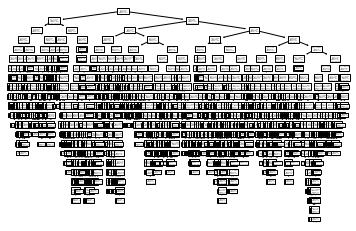

In [78]:
fig = clf_decision['classifier'].fit(X_train,y_train)
tree.plot_tree(fig)
plt.show()

In [79]:
dotfile = open("fig.dot", 'w')
tree.export_graphviz(fig, out_file=dotfile, feature_names=x.columns)
dotfile.close()

In [80]:
df['importances_tree'] = clf_decision['classifier'].feature_importances_
df.sort_values('importances_tree', ascending=False)

,feature,coefficient,odds,importances_tree
7,MonthlyCharges,-1.054164,0.348484,0.189444
25,Contract_Month-to-month,-1.450122,0.234542,0.174832
8,TotalCharges,0.194777,1.215040,0.163443
4,tenure,0.061455,1.063383,0.123589
12,InternetService_Fiber optic,-0.947650,0.387651,0.049841
6,PaperlessBilling,-0.357393,0.699498,0.027403
1,SeniorCitizen,3.953010,52.091953,0.027019
3,Dependents,-0.162797,0.849764,0.024004
0,gender,-1.698112,0.183029,0.022868
2,Partner,1.086247,2.963132,0.020315


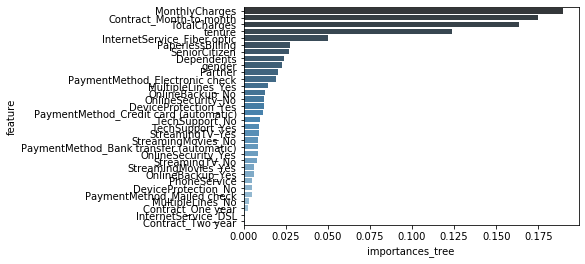

In [81]:
sns.barplot(x="importances_tree", y="feature", 
           data=df.sort_values('importances_tree', ascending=False), palette="Blues_d")

# class imbalance

In [82]:
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler()
X_rus, y_rus = ros.fit_resample(x, y)
X_train_rus,X_test_rus,y_train_rus,y_test_rus=train_test_split(X_rus, y_rus,test_size=0.3,random_state=0)
clf_decision.fit(X_train_rus,y_train_rus)
y_predict_rus=clf_decision.predict(X_test_rus)

print("original shape",Counter(y))
print("random under sampled shape",Counter(y_rus))
print("Accuracy score:",metrics.accuracy_score(y_test_rus, y_predict_rus))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_rus,y_predict_rus,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_rus, y_predict_rus))

original shape Counter({0: 5174, 1: 1869})
random under sampled shape Counter({0: 1869, 1: 1869})
Accuracy score: 0.6827094474153298

 confusion_matrix: 
 [[381 180]
 [176 385]]
classification_report:
               precision    recall  f1-score   support

           0       0.68      0.68      0.68       561
           1       0.68      0.69      0.68       561

    accuracy                           0.68      1122
   macro avg       0.68      0.68      0.68      1122
weighted avg       0.68      0.68      0.68      1122



In [83]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler()
X_ros, y_ros = ros.fit_resample(x, y)
print("original shape",Counter(y))
print("random over sampled shape",Counter(y_ros))
X_train_ros,X_test_ros,y_train_ros,y_test_ros=train_test_split(X_ros, y_ros,test_size=0.3,random_state=99)
clf_decision.fit(X_train_ros,y_train_ros)
y_predict_ros=clf_decision.predict(X_test_ros)
print("Accuracy score:",metrics.accuracy_score(y_test_ros, y_predict_ros))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_ros,y_predict_ros,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_ros, y_predict_ros))

original shape Counter({0: 5174, 1: 1869})
random over sampled shape Counter({0: 5174, 1: 5174})
Accuracy score: 0.8460547504025765

 confusion_matrix: 
 [[1182  352]
 [ 126 1445]]
classification_report:
               precision    recall  f1-score   support

           0       0.90      0.77      0.83      1534
           1       0.80      0.92      0.86      1571

    accuracy                           0.85      3105
   macro avg       0.85      0.85      0.84      3105
weighted avg       0.85      0.85      0.85      3105



In [84]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state = 2)
X_sm, y_sm = sm.fit_resample(x,y)
print("original shape",Counter(y))
print("SMOTE sampled shape",Counter(y_sm))
X_train_sm,X_test_sm,y_train_sm,y_test_sm=train_test_split(X_sm, y_sm,test_size=0.3,random_state=0)
clf_decision.fit(X_train_sm,y_train_sm)
y_predict_sm=clf_decision.predict(X_test_sm)
print("Accuracy score:",metrics.accuracy_score(y_test_sm, y_predict_sm))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_sm,y_predict_sm,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_sm, y_predict_sm))

original shape Counter({0: 5174, 1: 1869})
SMOTE sampled shape Counter({0: 5174, 1: 5174})
Accuracy score: 0.8115942028985508

 confusion_matrix: 
 [[1248  299]
 [ 286 1272]]
classification_report:
               precision    recall  f1-score   support

           0       0.81      0.81      0.81      1547
           1       0.81      0.82      0.81      1558

    accuracy                           0.81      3105
   macro avg       0.81      0.81      0.81      3105
weighted avg       0.81      0.81      0.81      3105



In [85]:
from imblearn.over_sampling import ADASYN
ada=ADASYN()
X_ada, y_ada = ada.fit_resample(x,y)
print("original shape",Counter(y))
print("ADASYN sampled shape",Counter(y_ada))
X_train_ada,X_test_ada,y_train_ada,y_test_ada=train_test_split(X_ada, y_ada,test_size=0.3,random_state=0)
clf_decision.fit(X_train_ada,y_train_ada)
y_predict_ada=clf_decision.predict(X_test_ada)
print("Accuracy score:",metrics.accuracy_score(y_test_ada, y_predict_ada))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_ada,y_predict_ada,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_ada, y_predict_ada))

original shape Counter({0: 5174, 1: 1869})
ADASYN sampled shape Counter({1: 5234, 0: 5174})
Accuracy score: 0.7915465898174832

 confusion_matrix: 
 [[1204  361]
 [ 290 1268]]
classification_report:
               precision    recall  f1-score   support

           0       0.81      0.77      0.79      1565
           1       0.78      0.81      0.80      1558

    accuracy                           0.79      3123
   macro avg       0.79      0.79      0.79      3123
weighted avg       0.79      0.79      0.79      3123



# Permutation feature importance

In [87]:
perm = PermutationImportance(clf_decision).fit(x,y)
eli5.show_weights(perm,feature_names=x.columns.tolist())

Weight,Feature
0.2352 ± 0.0111,MonthlyCharges
0.2208 ± 0.0035,Contract_Two year
0.1612 ± 0.0049,Contract_One year
0.1606 ± 0.0052,TotalCharges
0.1504 ± 0.0036,tenure
0.0956 ± 0.0082,MultipleLines_No
0.0787 ± 0.0013,Contract_Month-to-month
0.0637 ± 0.0023,OnlineSecurity_Yes
0.0627 ± 0.0009,StreamingMovies_Yes
0.0603 ± 0.0047,OnlineSecurity_No


# LIME

In [230]:
i=108

print("Actual" , y_test_sm.iloc[i])
exp = explainer.explain_instance(
    data_row=X_test_sm.iloc[i], 
    predict_fn=clf_decision['classifier'].predict_proba
)
exp.show_in_notebook(show_table=True)

Actual 0


# SHAP

In [89]:
shap.initjs()
shap_explainer = shap.TreeExplainer(clf_decision['classifier'])
shap_values = shap_explainer.shap_values(X_test)
shap.force_plot(shap_explainer.expected_value[y_test.iloc[1]], shap_values[1][1], X_test.iloc[1], feature_names=X_train.columns)

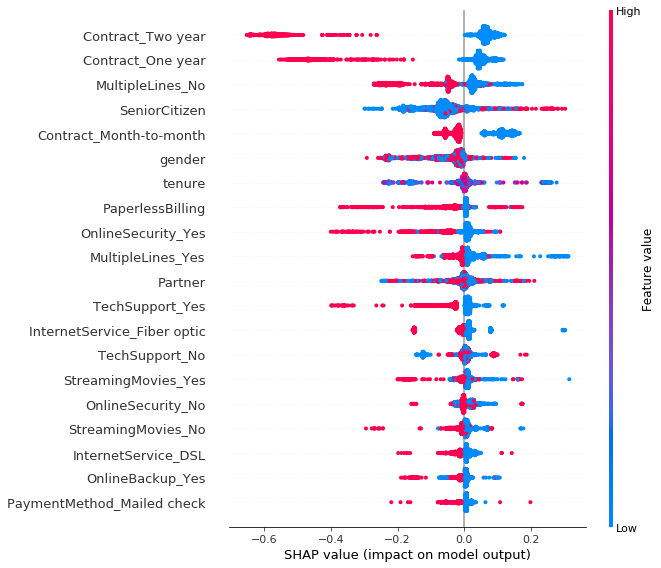

In [90]:
shap.summary_plot(shap_values[1], X_test)

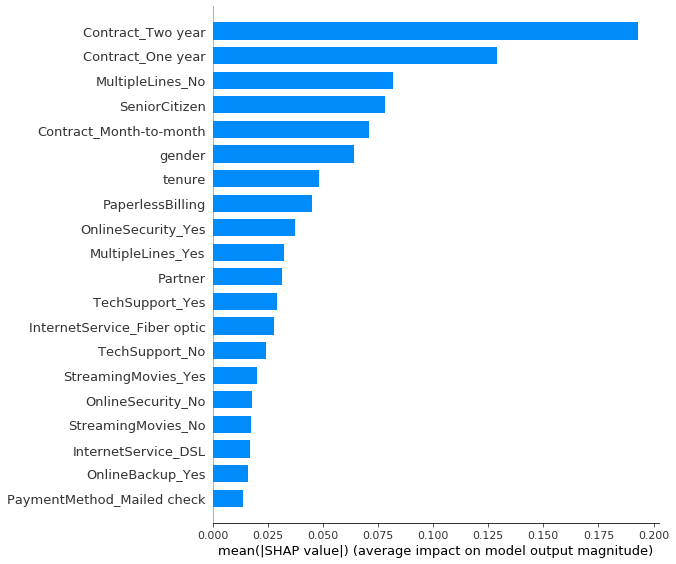

In [91]:
shap.summary_plot(shap_values[1], X_test, plot_type="bar")

In [396]:
exp_decision = dx.Explainer(clf_decision,x,y,verbose = False)
fobject= exp_decision.model_fairness(protected = protected_values(x), privileged='maleyoung')
fobject.fairness_check(epsilon = 0.8)

Bias detected in 4 metrics: TPR, PPV, FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceeded acceptable limits set by epsilon.

Ratios of metrics, based on 'maleyoung'. Parameter 'epsilon' was set to 0.8 and therefore metrics should be within (0.8, 1.25)
                  TPR       ACC       PPV       FPR       STP
femaleold    1.182131  0.911028  1.191150  1.794118  1.795833
femaleyoung  1.106529  1.008772  1.033628  1.066176  1.100000
maleold      1.353952  1.000000  1.306195  1.433824  1.829167


In [397]:
exp_decision.model_performance()

,recall,precision,f1,accuracy,auc
DecisionTreeClassifier,0.64473,0.607665,0.625649,0.795258,0.753489


In [93]:
fobject.result

,TPR,TNR,PPV,NPV,FNR,FPR,FDR,FOR,ACC,STP
femaleold,0.994206,0.973031,1.106003,0.937304,1.036496,1.342466,0.617512,2.395349,0.969298,1.630350
femaleyoung,1.016222,1.008630,1.034483,1.003135,0.897810,0.890411,0.875576,0.930233,1.009868,1.007782
maleold,1.075319,0.966559,1.100894,0.989551,0.525547,1.424658,0.635945,1.232558,0.996711,1.723735
maleyoung,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [94]:
fobject.plot()

In [95]:
exp_decision_rus = dx.Explainer(clf_decision,X_rus,y_rus)
exp_decision_rus.model_performance().result
fobject_rus= exp_decision_rus.model_fairness(protected = protected_values(X_rus), privileged='maleyoung')
fobject_rus.fairness_check(epsilon = 0.8)
fobject_rus.metric_scores
fobject_rus.plot()

Preparation of a new explainer is initiated

  -> data              : 3738 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 3738 values
  -> model_class       : sklearn.tree._classes.DecisionTreeClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0, mean = 0.473, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -1.0, mean = 0.0267, max = 1.0
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria exc

In [404]:
exp_decision_ros = dx.Explainer(clf_decision,X_ros,y_ros)
exp_decision_ros.model_performance().result
fobject_ros = exp_decision_ros.model_fairness(protected = protected_values(X_ros), privileged='maleyoung')
fobject_ros.fairness_check(epsilon = 0.8)
fobject_ros.metric_scores
fobject_ros.plot()
exp_decision_ros.model_performance()

Preparation of a new explainer is initiated

  -> data              : 10348 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10348 values
  -> model_class       : sklearn.tree._classes.DecisionTreeClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0, mean = 0.393, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -1.0, mean = 0.107, max = 1.0
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 3 metrics: TPR, FPR, STP

Conclusion: your model is not fair because 2 or more criter

,recall,precision,f1,accuracy,auc
DecisionTreeClassifier,0.635485,0.808657,0.711688,0.742559,0.812138


In [405]:
exp_decision_sm = dx.Explainer(clf_decision,X_sm,y_sm)
exp_decision_sm.model_performance().result
fobject_sm = exp_decision_sm.model_fairness(protected = protected_values(X_sm), privileged='maleyoung')
fobject_sm.fairness_check(epsilon = 0.8)
fobject_sm.metric_scores
fobject_sm.plot()
exp_decision_sm.model_performance()

Preparation of a new explainer is initiated

  -> data              : 10348 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10348 values
  -> model_class       : sklearn.tree._classes.DecisionTreeClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0, mean = 0.478, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -1.0, mean = 0.0223, max = 1.0
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria e

,recall,precision,f1,accuracy,auc
DecisionTreeClassifier,0.804986,0.842606,0.823367,0.82731,0.857962


In [406]:
exp_decision_ada = dx.Explainer(clf_decision,X_ada,y_ada)
exp_decision_ada.model_performance().result
fobject_ada = exp_decision_ada.model_fairness(protected = protected_values(X_ada), privileged='maleyoung')
fobject_ada.fairness_check(epsilon = 0.8)
fobject_ada.metric_scores
fobject_ada.plot()
exp_decision_ada.model_performance()

Preparation of a new explainer is initiated

  -> data              : 10408 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10408 values
  -> model_class       : sklearn.tree._classes.DecisionTreeClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0, mean = 0.487, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -1.0, mean = 0.016, max = 1.0
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria ex

,recall,precision,f1,accuracy,auc
DecisionTreeClassifier,0.81945,0.846457,0.832735,0.834454,0.862393


# Random forest

In [101]:
from sklearn.ensemble import RandomForestClassifier
clf_randforest = Pipeline([('transformer',ct),
                ('classifier', RandomForestClassifier())
               ])
clf_randforest.fit(X_train,y_train)
y_predict=clf_randforest.predict(X_test)


print("Accuracy score:",metrics.accuracy_score(y_test, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test, y_predict))

Accuracy score: 0.7823000473260767

 confusion_matrix: 
 [[1386  174]
 [ 286  267]]
classification_report:
               precision    recall  f1-score   support

           0       0.83      0.89      0.86      1560
           1       0.61      0.48      0.54       553

    accuracy                           0.78      2113
   macro avg       0.72      0.69      0.70      2113
weighted avg       0.77      0.78      0.77      2113



In [102]:
clf_randforest.fit(X_train_rus,y_train_rus)
y_predict=clf_randforest.predict(X_test_rus)

print("Accuracy score:",metrics.accuracy_score(y_test_rus, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_rus,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_rus, y_predict))

Accuracy score: 0.7477718360071302

 confusion_matrix: 
 [[412 149]
 [134 427]]
classification_report:
               precision    recall  f1-score   support

           0       0.75      0.73      0.74       561
           1       0.74      0.76      0.75       561

    accuracy                           0.75      1122
   macro avg       0.75      0.75      0.75      1122
weighted avg       0.75      0.75      0.75      1122



In [103]:
clf_randforest.fit(X_train_ros,y_train_ros)
y_predict=clf_randforest.predict(X_test_ros)

print("Accuracy score:",metrics.accuracy_score(y_test_ros, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_ros,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_ros, y_predict))

Accuracy score: 0.8853462157809984

 confusion_matrix: 
 [[1282  252]
 [ 104 1467]]
classification_report:
               precision    recall  f1-score   support

           0       0.92      0.84      0.88      1534
           1       0.85      0.93      0.89      1571

    accuracy                           0.89      3105
   macro avg       0.89      0.88      0.88      3105
weighted avg       0.89      0.89      0.89      3105



In [104]:
clf_randforest.fit(X_train_sm,y_train_sm)
y_predict=clf_randforest.predict(X_test_sm)


print("Accuracy score:",metrics.accuracy_score(y_test_sm, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_sm,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_sm, y_predict))

Accuracy score: 0.8528180354267311

 confusion_matrix: 
 [[1316  231]
 [ 226 1332]]
classification_report:
               precision    recall  f1-score   support

           0       0.85      0.85      0.85      1547
           1       0.85      0.85      0.85      1558

    accuracy                           0.85      3105
   macro avg       0.85      0.85      0.85      3105
weighted avg       0.85      0.85      0.85      3105



In [105]:
clf_randforest.fit(X_train_ada,y_train_ada)
y_predict=clf_randforest.predict(X_test_ada)


print("Accuracy score:",metrics.accuracy_score(y_test_ada, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_ada,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_ada, y_predict))

Accuracy score: 0.8530259365994236

 confusion_matrix: 
 [[1334  231]
 [ 228 1330]]
classification_report:
               precision    recall  f1-score   support

           0       0.85      0.85      0.85      1565
           1       0.85      0.85      0.85      1558

    accuracy                           0.85      3123
   macro avg       0.85      0.85      0.85      3123
weighted avg       0.85      0.85      0.85      3123



In [106]:
perm = PermutationImportance(clf_randforest).fit(x,y)
eli5.show_weights(perm,feature_names=x.columns.tolist())

Weight,Feature
0.0671 ± 0.0052,MonthlyCharges
0.0520 ± 0.0041,tenure
0.0334 ± 0.0035,MultipleLines_No
0.0320 ± 0.0018,TotalCharges
0.0316 ± 0.0023,OnlineSecurity_Yes
0.0300 ± 0.0044,Contract_Two year
0.0256 ± 0.0028,TechSupport_Yes
0.0254 ± 0.0038,Contract_One year
0.0252 ± 0.0021,PaymentMethod_Mailed check
0.0236 ± 0.0044,Dependents


In [232]:
i=108

print("Actual" , y_test_sm.iloc[i])
exp = explainer.explain_instance(
    data_row=X_test_sm.iloc[i], 
    predict_fn=clf_randforest['classifier'].predict_proba
)
exp.show_in_notebook(show_table=True)

Actual 0


In [256]:
shap.initjs()
shap_explainer = shap.TreeExplainer(clf_randforest['classifier'])
shap_values = shap_explainer.shap_values(X_test)
shap.force_plot(shap_explainer.expected_value[y_test.iloc[1]], shap_values[1][1], X_test.iloc[1], 
                feature_names=X_train.columns)

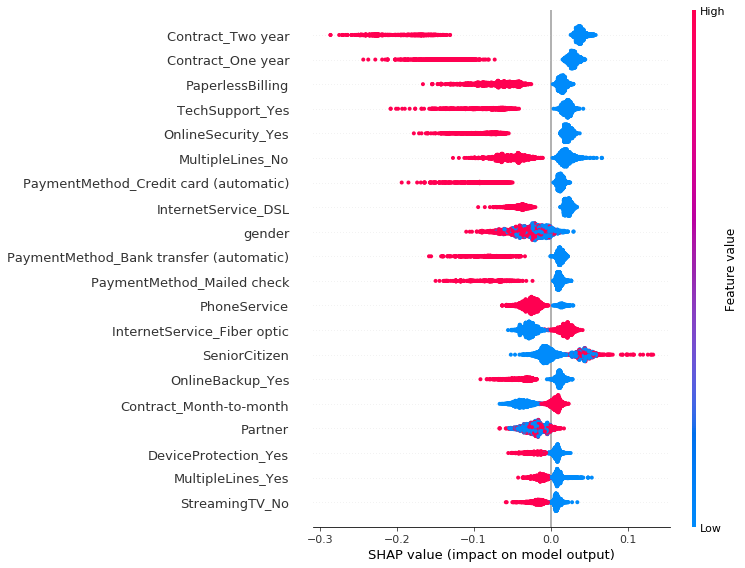

In [262]:
shap.summary_plot(shap_values[1], X_test)

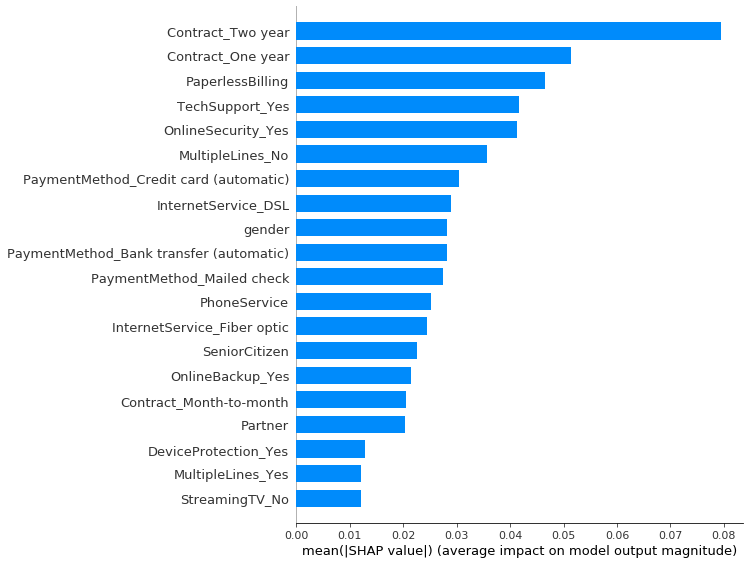

In [263]:
shap.summary_plot(shap_values[1], X_test, plot_type="bar")

In [341]:
exp_randforest = dx.Explainer(clf_randforest,x,y)
exp_randforest.model_performance().result
fobject_randforest = exp_randforest.model_fairness(protected = protected_values(x), privileged='maleyoung')
fobject_randforest.fairness_check(epsilon = 0.8)
fobject_randforest.metric_scores
fobject_randforest.plot()

Preparation of a new explainer is initiated

  -> data              : 7043 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 7043 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0, mean = 0.283, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.99, mean = -0.0173, max = 0.99
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criter

In [407]:
exp_randforest_rus = dx.Explainer(clf_randforest,X_rus,y_rus)
exp_randforest_rus.model_performance().result
fobject_randforest_rus = exp_randforest_rus.model_fairness(protected = protected_values(X_rus), privileged='maleyoung')
fobject_randforest_rus.fairness_check(epsilon = 0.8)
fobject_randforest_rus.metric_scores
fobject_randforest_rus.plot()
exp_randforest_rus.model_performance().result

Preparation of a new explainer is initiated

  -> data              : 3738 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 3738 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0, mean = 0.398, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.87, mean = 0.102, max = 0.98
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria

,recall,precision,f1,accuracy,auc
RandomForestClassifier,0.794007,0.92808,0.855825,0.866239,0.949527


In [408]:
exp_randforest_ros = dx.Explainer(clf_randforest,X_ros,y_ros)
exp_randforest_ros.model_performance().result
fobject_randforest_ros = exp_randforest_ros.model_fairness(protected = protected_values(X_ros), privileged='maleyoung')
fobject_randforest_ros.fairness_check(epsilon = 0.8)
fobject_randforest_ros.metric_scores
fobject_randforest_ros.plot()
exp_randforest_ros.model_performance().result

Preparation of a new explainer is initiated

  -> data              : 10348 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10348 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0, mean = 0.398, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.98, mean = 0.102, max = 0.98
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 3 metrics: TPR, FPR, STP

Conclusion: your model is not fair because 2 or more c

,recall,precision,f1,accuracy,auc
RandomForestClassifier,0.786046,0.92558,0.850125,0.861422,0.944684


In [409]:
exp_randforest_sm = dx.Explainer(clf_randforest,X_sm,y_sm)
exp_randforest_sm.model_performance().result
fobject_randforest_sm = exp_randforest_sm.model_fairness(protected = protected_values(X_sm), privileged='maleyoung')
fobject_randforest_sm.fairness_check(epsilon = 0.8)
fobject_randforest_sm.metric_scores
fobject_randforest_sm.plot()
exp_randforest_sm.model_performance().result

Preparation of a new explainer is initiated

  -> data              : 10348 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10348 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0, mean = 0.472, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.98, mean = 0.0281, max = 0.98
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more crite

,recall,precision,f1,accuracy,auc
RandomForestClassifier,0.894279,0.933993,0.913705,0.915539,0.972088


In [410]:
exp_randforest_ada = dx.Explainer(clf_randforest,X_ada,y_ada)
exp_randforest_ada.model_performance().result
fobject_randforest_ada = exp_randforest_ada.model_fairness(protected = protected_values(X_ada), privileged='maleyoung')
fobject_randforest_ada.fairness_check(epsilon = 0.8)
fobject_randforest_ada.metric_scores
fobject_randforest_ada.plot()
exp_randforest_ada.model_performance().result

Preparation of a new explainer is initiated

  -> data              : 10408 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10408 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0, mean = 0.479, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.98, mean = 0.0237, max = 0.98
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more crite

,recall,precision,f1,accuracy,auc
RandomForestClassifier,0.896828,0.934874,0.915456,0.916699,0.972353


# Bagging

In [126]:
from sklearn.ensemble import BaggingClassifier
model = BaggingClassifier()
clf_bagging = Pipeline([('transformer',ct),
                ('classifier', model)
               ])
clf_bagging.fit(X_train_rus,y_train_rus)
y_predict=clf_bagging.predict(X_test_rus)
print("Accuracy score:",metrics.accuracy_score(y_test_rus, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_rus,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_rus, y_predict))

Accuracy score: 0.7112299465240641

 confusion_matrix: 
 [[415 146]
 [178 383]]
classification_report:
               precision    recall  f1-score   support

           0       0.70      0.74      0.72       561
           1       0.72      0.68      0.70       561

    accuracy                           0.71      1122
   macro avg       0.71      0.71      0.71      1122
weighted avg       0.71      0.71      0.71      1122



In [127]:
clf_bagging.fit(X_train_ros,y_train_ros)
y_predict=clf_bagging.predict(X_test_ros)
print("Accuracy score:",metrics.accuracy_score(y_test_ros, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_ros,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_ros, y_predict))

Accuracy score: 0.8718196457326892

 confusion_matrix: 
 [[1283  251]
 [ 147 1424]]
classification_report:
               precision    recall  f1-score   support

           0       0.90      0.84      0.87      1534
           1       0.85      0.91      0.88      1571

    accuracy                           0.87      3105
   macro avg       0.87      0.87      0.87      3105
weighted avg       0.87      0.87      0.87      3105



In [128]:
from sklearn.ensemble import BaggingClassifier
model = BaggingClassifier()
clf_bagging = Pipeline([('transformer',ct),
                ('classifier', model)
               ])
clf_bagging.fit(X_train_sm,y_train_sm)
y_predict=clf_bagging.predict(X_test_sm)
print("Accuracy score:",metrics.accuracy_score(y_test_sm, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_sm,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_sm, y_predict))

Accuracy score: 0.8470209339774557

 confusion_matrix: 
 [[1356  191]
 [ 284 1274]]
classification_report:
               precision    recall  f1-score   support

           0       0.83      0.88      0.85      1547
           1       0.87      0.82      0.84      1558

    accuracy                           0.85      3105
   macro avg       0.85      0.85      0.85      3105
weighted avg       0.85      0.85      0.85      3105



In [129]:
clf_bagging.fit(X_train_ada,y_train_ada)
y_predict=clf_bagging.predict(X_test_ada)
print("Accuracy score:",metrics.accuracy_score(y_test_ada, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_ada,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_ada, y_predict))

Accuracy score: 0.8389369196285623

 confusion_matrix: 
 [[1350  215]
 [ 288 1270]]
classification_report:
               precision    recall  f1-score   support

           0       0.82      0.86      0.84      1565
           1       0.86      0.82      0.83      1558

    accuracy                           0.84      3123
   macro avg       0.84      0.84      0.84      3123
weighted avg       0.84      0.84      0.84      3123



# SVM

In [130]:
from sklearn.svm import SVC
model = SVC(class_weight='balanced', probability=True)
clf_svm = Pipeline([('transformer',ct),
                ('classifier', model)
               ])
clf_svm.fit(X_train,y_train)
y_predict=clf_svm.predict(X_test)
print("Accuracy score:",metrics.accuracy_score(y_test, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test, y_predict))

Accuracy score: 0.7453857075248462

 confusion_matrix: 
 [[1153  407]
 [ 131  422]]
classification_report:
               precision    recall  f1-score   support

           0       0.90      0.74      0.81      1560
           1       0.51      0.76      0.61       553

    accuracy                           0.75      2113
   macro avg       0.70      0.75      0.71      2113
weighted avg       0.80      0.75      0.76      2113



In [131]:
from sklearn.svm import SVC
model = SVC(probability=True)
clf_svm = Pipeline([('transformer',ct),
                ('classifier', model)
               ])
clf_svm.fit(X_train,y_train)
y_predict=clf_svm.predict(X_test)

print("Accuracy score:",metrics.accuracy_score(y_test, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test, y_predict))

Accuracy score: 0.7988641741599621

 confusion_matrix: 
 [[1417  143]
 [ 282  271]]
classification_report:
               precision    recall  f1-score   support

           0       0.83      0.91      0.87      1560
           1       0.65      0.49      0.56       553

    accuracy                           0.80      2113
   macro avg       0.74      0.70      0.72      2113
weighted avg       0.79      0.80      0.79      2113



In [264]:
clf_svm.fit(X_train_ros,y_train_ros)
y_predict=clf_svm.predict(X_test_ros)
print("Accuracy score:",metrics.accuracy_score(y_test_ros, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_ros,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_ros, y_predict))

Accuracy score: 0.7755233494363929

 confusion_matrix: 
 [[1159  375]
 [ 322 1249]]
classification_report:
               precision    recall  f1-score   support

           0       0.78      0.76      0.77      1534
           1       0.77      0.80      0.78      1571

    accuracy                           0.78      3105
   macro avg       0.78      0.78      0.78      3105
weighted avg       0.78      0.78      0.78      3105



In [265]:
clf_svm.fit(X_train_rus,y_train_rus)
y_predict=clf_svm.predict(X_test_rus)
print("Accuracy score:",metrics.accuracy_score(y_test_rus, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_rus,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_rus, y_predict))

Accuracy score: 0.7531194295900179

 confusion_matrix: 
 [[413 148]
 [129 432]]
classification_report:
               precision    recall  f1-score   support

           0       0.76      0.74      0.75       561
           1       0.74      0.77      0.76       561

    accuracy                           0.75      1122
   macro avg       0.75      0.75      0.75      1122
weighted avg       0.75      0.75      0.75      1122



In [345]:
clf_svm.fit(X_train_ros,y_train_ros)
y_predict=clf_svm.predict(X_test_ros)
print("Accuracy score:",metrics.accuracy_score(y_test_ros, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_ros,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_ros, y_predict))

Accuracy score: 0.7755233494363929

 confusion_matrix: 
 [[1159  375]
 [ 322 1249]]
classification_report:
               precision    recall  f1-score   support

           0       0.78      0.76      0.77      1534
           1       0.77      0.80      0.78      1571

    accuracy                           0.78      3105
   macro avg       0.78      0.78      0.78      3105
weighted avg       0.78      0.78      0.78      3105



In [267]:
clf_svm.fit(X_train_sm,y_train_sm)
y_predict=clf_svm.predict(X_test_sm)
print("Accuracy score:",metrics.accuracy_score(y_test_sm, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_sm,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_sm, y_predict))

Accuracy score: 0.8573268921095009

 confusion_matrix: 
 [[1355  192]
 [ 251 1307]]
classification_report:
               precision    recall  f1-score   support

           0       0.84      0.88      0.86      1547
           1       0.87      0.84      0.86      1558

    accuracy                           0.86      3105
   macro avg       0.86      0.86      0.86      3105
weighted avg       0.86      0.86      0.86      3105



In [268]:
clf_svm.fit(X_train_ada,y_train_ada)
y_predict=clf_svm.predict(X_test_ada)
print("Accuracy score:",metrics.accuracy_score(y_test_ada, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_ada,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_ada, y_predict))

Accuracy score: 0.8530259365994236

 confusion_matrix: 
 [[1372  193]
 [ 266 1292]]
classification_report:
               precision    recall  f1-score   support

           0       0.84      0.88      0.86      1565
           1       0.87      0.83      0.85      1558

    accuracy                           0.85      3123
   macro avg       0.85      0.85      0.85      3123
weighted avg       0.85      0.85      0.85      3123



In [412]:
exp_clf_svm = dx.Explainer(clf_svm,x,y,verbose = False)
fobject_clf_svm = exp_clf_svm.model_fairness(protected = protected_values(x), privileged='maleyoung')
fobject_clf_svm.fairness_check(epsilon = 0.8)
exp_clf_svm.model_performance()

Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceeded acceptable limits set by epsilon.

Ratios of metrics, based on 'maleyoung'. Parameter 'epsilon' was set to 0.8 and therefore metrics should be within (0.8, 1.25)
                  TPR       ACC       PPV       FPR       STP
femaleold    1.201581  0.887640  1.094033  2.344086  1.990625
femaleyoung  1.028986  0.985019  0.978300  1.123656  1.081250
maleold      1.189723  0.898876  1.097649  2.193548  1.909375


,recall,precision,f1,accuracy,auc
SVC,0.805243,0.562407,0.662266,0.782053,0.869006


In [351]:
fobject_clf_svm.plot()

In [414]:
exp_clf_svm_ros = dx.Explainer(clf_svm,X_ros,y_ros)
fobject_clf_svm_ros = exp_clf_svm_ros.model_fairness(protected = protected_values(X_ros), privileged='maleyoung')
fobject_clf_svm_ros.fairness_check(epsilon = 0.8)
fobject_clf_svm_ros.metric_scores
fobject_clf_svm_ros.plot()
exp_clf_svm.model_performance()

Preparation of a new explainer is initiated

  -> data              : 10348 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10348 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0209, mean = 0.498, max = 0.928
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.908, mean = 0.00187, max = 0.939
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceeded ac

,recall,precision,f1,accuracy,auc
SVC,0.805243,0.562407,0.662266,0.782053,0.869006


In [415]:
exp_clf_svm_rus = dx.Explainer(clf_svm,X_rus,y_rus)
fobject_clf_svm_rus = exp_clf_svm_rus.model_fairness(protected = protected_values(X_rus), privileged='maleyoung')
fobject_clf_svm_rus.fairness_check(epsilon = 0.8)
fobject_clf_svm_rus.metric_scores
fobject_clf_svm_rus.plot()
exp_clf_svm_rus.model_performance()

Preparation of a new explainer is initiated

  -> data              : 3738 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 3738 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0275, mean = 0.495, max = 0.928
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.893, mean = 0.00503, max = 0.939
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceeded acce

,recall,precision,f1,accuracy,auc
SVC,0.805243,0.788784,0.796929,0.79481,0.87309


In [417]:
exp_clf_svm_sm = dx.Explainer(clf_svm,X_sm,y_sm)
fobject_clf_svm_sm = exp_clf_svm_sm.model_fairness(protected = protected_values(X_sm), privileged='maleyoung')
fobject_clf_svm_sm.fairness_check(epsilon = 0.8)
fobject_clf_svm_sm.metric_scores
fobject_clf_svm_sm.plot()
exp_clf_svm_sm.model_performance()

Preparation of a new explainer is initiated

  -> data              : 10348 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10348 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0209, mean = 0.482, max = 0.928
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.908, mean = 0.0183, max = 0.947
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 3 metrics: TPR, FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceede

,recall,precision,f1,accuracy,auc
SVC,0.764206,0.771512,0.767842,0.768941,0.848363


In [416]:
exp_clf_svm_ada = dx.Explainer(clf_svm,X_ada,y_ada)
fobject_clf_svm_ada = exp_clf_svm_ada.model_fairness(protected = protected_values(X_ada), privileged='maleyoung')
fobject_clf_svm_ada.fairness_check(epsilon = 0.8)
fobject_clf_svm_ada.metric_scores
fobject_clf_svm_ada.plot()
exp_clf_svm_ada.model_performance()

Preparation of a new explainer is initiated

  -> data              : 10408 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10408 values
  -> model_class       : sklearn.svm._classes.SVC (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0209, mean = 0.459, max = 0.928
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.908, mean = 0.0439, max = 0.947
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 3 metrics: TPR, FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceede

,recall,precision,f1,accuracy,auc
SVC,0.688957,0.754867,0.720408,0.731072,0.816422


# XG Boost

In [281]:
from xgboost import XGBClassifier
model = XGBClassifier()
clf_xgb = Pipeline([('transformer',ct),
                ('classifier', model)
               ])
clf_xgb.fit(X_train, y_train)
y_predict = clf_xgb.predict(X_test)

print("Accuracy score:",metrics.accuracy_score(y_test, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test, y_predict))

C:\Users\hp\Anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[15:35:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy score: 0.7893989588263133

 confusion_matrix: 
 [[1375  185]
 [ 260  293]]
classification_report:
               precision    recall  f1-score   support

           0       0.84      0.88      0.86      1560
           1       0.61      0.53      0.57       553

    accuracy                           0.79      2113
   macro avg       0.73      0.71      0.71      2113
weighted avg       0.78      0.79      0.78      2113



In [282]:
clf_xgb.fit(X_train_rus, y_train_rus)
y_predict = clf_xgb.predict(X_test_rus)


print("Accuracy score:",metrics.accuracy_score(y_test_rus, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_rus,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_rus, y_predict))


[15:35:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\hp\Anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Accuracy score: 0.7156862745098039

 confusion_matrix: 
 [[393 168]
 [151 410]]
classification_report:
               precision    recall  f1-score   support

           0       0.72      0.70      0.71       561
           1       0.71      0.73      0.72       561

    accuracy                           0.72      1122
   macro avg       0.72      0.72      0.72      1122
weighted avg       0.72      0.72      0.72      1122



In [283]:
clf_xgb.fit(X_train_ros, y_train_ros)
y_predict = clf_xgb.predict(X_test_ros)


print("Accuracy score:",metrics.accuracy_score(y_test_ros, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_ros,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_ros, y_predict))


[15:35:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\hp\Anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Accuracy score: 0.8473429951690822

 confusion_matrix: 
 [[1216  318]
 [ 156 1415]]
classification_report:
               precision    recall  f1-score   support

           0       0.89      0.79      0.84      1534
           1       0.82      0.90      0.86      1571

    accuracy                           0.85      3105
   macro avg       0.85      0.85      0.85      3105
weighted avg       0.85      0.85      0.85      3105



In [284]:
from xgboost import XGBClassifier
model = XGBClassifier()
clf_xgb = Pipeline([('transformer',ct),
                ('classifier', model)
               ])
clf_xgb.fit(X_train_sm, y_train_sm)
y_predict = clf_xgb.predict(X_test_sm)


print("Accuracy score:",metrics.accuracy_score(y_test_sm, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_sm,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_sm, y_predict))


[15:35:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\hp\Anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Accuracy score: 0.8544283413848631

 confusion_matrix: 
 [[1325  222]
 [ 230 1328]]
classification_report:
               precision    recall  f1-score   support

           0       0.85      0.86      0.85      1547
           1       0.86      0.85      0.85      1558

    accuracy                           0.85      3105
   macro avg       0.85      0.85      0.85      3105
weighted avg       0.85      0.85      0.85      3105



In [285]:
clf_xgb.fit(X_train_ada, y_train_ada)
y_predict = clf_xgb.predict(X_test_ada)


print("Accuracy score:",metrics.accuracy_score(y_test_ada, y_predict))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_ada,y_predict,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_ada, y_predict))


[15:35:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\hp\Anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



Accuracy score: 0.8536663464617356

 confusion_matrix: 
 [[1341  224]
 [ 233 1325]]
classification_report:
               precision    recall  f1-score   support

           0       0.85      0.86      0.85      1565
           1       0.86      0.85      0.85      1558

    accuracy                           0.85      3123
   macro avg       0.85      0.85      0.85      3123
weighted avg       0.85      0.85      0.85      3123



In [286]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_sm),
    feature_names=X_train_sm.columns,
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=X_test.iloc[100], 
    predict_fn=clf_xgb['classifier'].predict_proba
)
exp.show_in_notebook(show_table=True)

In [287]:
shap.initjs()
shap_explainer = shap.TreeExplainer(clf_xgb['classifier'])
shap_values = shap_explainer.shap_values(X_test)
shap.force_plot(shap_explainer.expected_value, shap_values[0,:], X_test.iloc[0,:])

C:\Users\hp\Anaconda3\lib\site-packages\xgboost\core.py:104: UserWarning:

ntree_limit is deprecated, use `iteration_range` or model slicing instead.



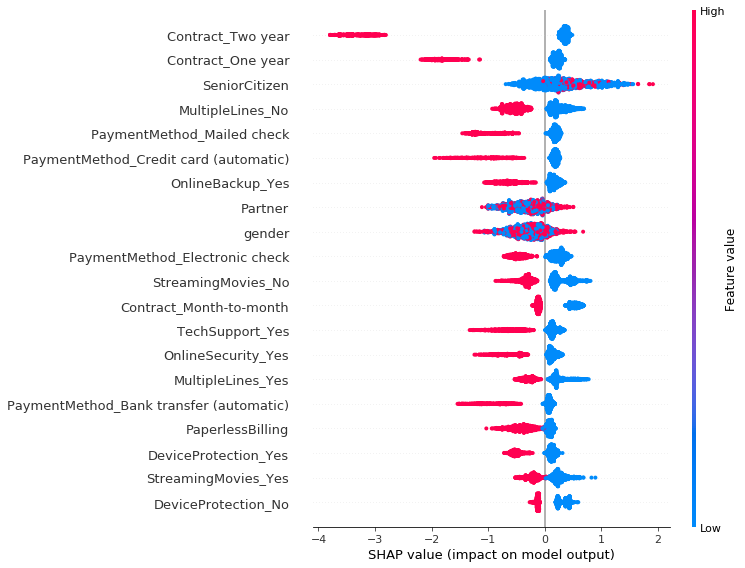

In [288]:
shap.summary_plot(shap_values, X_test)

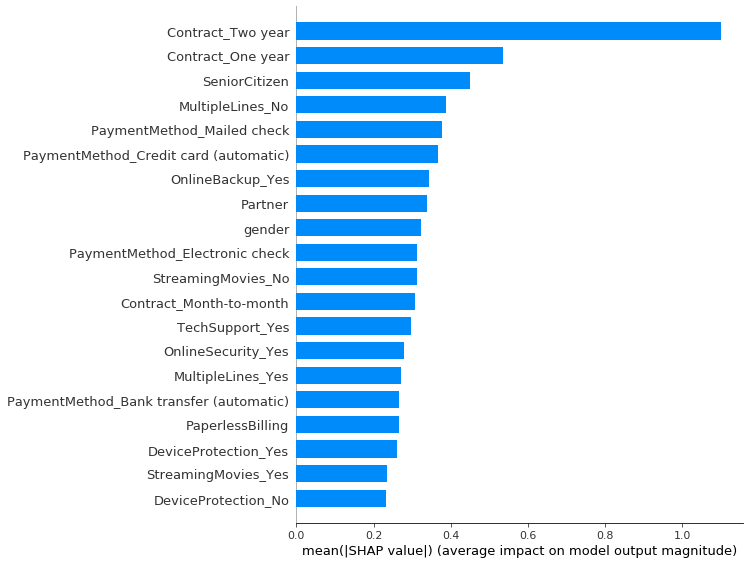

In [289]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

In [418]:
exp_clf_xgb = dx.Explainer(clf_xgb,x,y,verbose = False)
fobject_clf_xgb = exp_clf_xgb.model_fairness(protected = protected_values(x), privileged='maleyoung')
fobject_clf_xgb.fairness_check(epsilon = 0.8)
exp_clf_xgb.model_performance()

Bias detected in 3 metrics: TPR, FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceeded acceptable limits set by epsilon.

Ratios of metrics, based on 'maleyoung'. Parameter 'epsilon' was set to 0.8 and therefore metrics should be within (0.8, 1.25)
                  TPR       ACC       PPV       FPR       STP
femaleold    1.269366  0.927294  1.084302  2.307692  2.125000
femaleyoung  1.051056  0.988081  0.957849  1.243590  1.130208
maleold      1.283451  0.932062  1.072674  2.307692  2.114583


,recall,precision,f1,accuracy,auc
XGBClassifier,0.618513,0.691801,0.653107,0.825642,0.883228


In [296]:
fobject_clf_xgb.plot()

In [297]:
exp_clf_xgb_rus = dx.Explainer(clf_xgb,X_rus,y_rus)
exp_clf_xgb_rus.model_performance().result
fobject_clf_xgb_rus = exp_clf_xgb_rus.model_fairness(protected = protected_values(X_rus), privileged='maleyoung')
fobject_clf_xgb_rus.fairness_check(epsilon = 0.8)
fobject_clf_xgb_rus.metric_scores
fobject_clf_xgb_rus.plot()

Preparation of a new explainer is initiated

  -> data              : 3738 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 3738 values
  -> model_class       : xgboost.sklearn.XGBClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.000135, mean = 0.412, max = 0.994
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.981, mean = 0.088, max = 0.998
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceeded

In [419]:
exp_clf_xgb_ros = dx.Explainer(clf_xgb,X_ros,y_ros)
exp_clf_xgb_ros.model_performance().result
fobject_clf_xgb_ros = exp_clf_xgb_ros.model_fairness(protected = protected_values(X_ros), privileged='maleyoung')
fobject_clf_xgb_ros.fairness_check(epsilon = 0.8)
fobject_clf_xgb_ros.metric_scores
fobject_clf_xgb_ros.plot()
exp_clf_xgb_ros.model_performance()

Preparation of a new explainer is initiated

  -> data              : 10348 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10348 values
  -> model_class       : xgboost.sklearn.XGBClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.000114, mean = 0.356, max = 0.991
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.933, mean = 0.144, max = 0.998
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 3 metrics: TPR, FPR, STP

Conclusion: your model is not fair because 2 or more criteria e

,recall,precision,f1,accuracy,auc
XGBClassifier,0.613259,0.860358,0.716091,0.756861,0.880255


In [420]:
exp_clf_xgb_sm = dx.Explainer(clf_xgb,X_sm,y_sm)
exp_clf_xgb_sm.model_performance().result
fobject_clf_xgb_sm = exp_clf_xgb_sm.model_fairness(protected = protected_values(X_sm), privileged='maleyoung')
fobject_clf_xgb_sm.fairness_check(epsilon = 0.8)
fobject_clf_xgb_sm.metric_scores
fobject_clf_xgb_sm.plot()
exp_clf_xgb_sm.model_performance()

Preparation of a new explainer is initiated

  -> data              : 10348 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10348 values
  -> model_class       : xgboost.sklearn.XGBClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.000114, mean = 0.474, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.933, mean = 0.0262, max = 0.998
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceede

,recall,precision,f1,accuracy,auc
XGBClassifier,0.837457,0.893771,0.864698,0.86896,0.948426


In [342]:
exp_clf_xgb_ada = dx.Explainer(clf_xgb,X_ada,y_ada)
exp_clf_xgb_ada.model_performance().result
fobject_clf_xgb_ada = exp_clf_xgb_ada.model_fairness(protected = protected_values(X_ada), privileged='maleyoung')
fobject_clf_xgb_ada.fairness_check(epsilon = 0.8)
fobject_clf_xgb_ada.metric_scores
fobject_clf_xgb_ada.plot()

Preparation of a new explainer is initiated

  -> data              : 10408 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10408 values
  -> model_class       : xgboost.sklearn.XGBClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 6.76e-05, mean = 0.473, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.966, mean = 0.0297, max = 0.998
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more criteria exceede

# ANN

In [311]:
import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense
classifier= tf.keras.models.Sequential()
classifier.add(tf.keras.layers.Dense(6,kernel_initializer='uniform', input_dim=len(X_train.columns), activation="relu"))
                     
classifier.add(tf.keras.layers.Dense(6, kernel_initializer='uniform',
                     activation = 'relu'))
classifier.add(tf.keras.layers.Dense(1, kernel_initializer='uniform', 
                     activation = 'sigmoid'))
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
classifier.fit(X_train, y_train,epochs=100, batch_size=16, verbose=2)

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Train on 4930 samples
Epoch 1/100
4930/4930 - 0s - loss: 0.5705 - acc: 0.7331
Epoch 2/100
4930/4930 - 0s - loss: 0.5549 - acc: 0.7331
Epoch 3/100
4930/4930 - 0s - loss: 0.5318 - acc: 0.7331
Epoch 4/100
4930/4930 - 0s - loss: 0.4883 - acc: 0.7331
Epoch 5/100
4930/4930 - 0s - loss: 0.4703 - acc: 0.7331
Epoch 6/100
4930/4930 - 0s - loss: 0.4642 - acc: 0.7331
Epoch 7/100
4930/4930 - 0s - loss: 0.4556 - acc: 0.7651
Epoch 8/100
4930/4930 - 0s - loss: 0.4575 - acc: 0.7919
Epoch 9/100
4930/4930 - 0s - loss: 0.4546 - acc: 0.7917
Epoch 10/100
4930/4930 - 0s - loss: 0.4516 - acc: 0.7949
Epoch 11/100
4930/4930 - 0s - loss: 0.4481 - acc: 0.7931
Epoch 12/100
4930/4930 - 0s - loss: 0.4448 - acc: 0.7976
Epoch 13/100
4930/4930 - 0s - loss: 0.4455 - acc: 0.7982
Epoch 14/100
4930/4930 - 0s - loss: 0.4444 - acc: 0.7994
Epoch 15/100
4930/4930 - 0s - loss: 0.4400 - acc: 0.8008
Epoch 16/100
4

In [312]:
_, accuracy = classifier.evaluate(X_test, y_test, verbose=0)
print('Accuracy: %.2f' % (accuracy*100))

Accuracy: 79.51


C:\Users\hp\Anaconda3\lib\site-packages\keras\engine\training.py:2470: UserWarning:

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.



In [313]:
def prob(data):
    print(data.shape)
    y_pred=classifier.predict(data).reshape(-1, 1)
    y_pred =(y_pred>0.5)
    print(np.array(list(zip(1-y_pred.reshape(data.shape[0]),y_pred.reshape(data.shape[0])))))
    return np.hstack((1-y_pred,y_pred))

In [314]:
exp = explainer.explain_instance(
    data_row=X_test.iloc[100], 
    predict_fn=prob
)
exp.show_in_notebook(show_table=True)

(5000, 32)
[[0 1]
 [0 1]
 [1 0]
 ...
 [0 1]
 [1 0]
 [1 0]]


C:\Users\hp\Anaconda3\lib\site-packages\keras\engine\training.py:2470: UserWarning:

`Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.



In [315]:
import tensorflow as tf    
tf.compat.v1.disable_v2_behavior()

In [316]:
background = X_train.iloc[np.random.choice(X_train.shape[0], 100, replace=False)]

explainer = shap.DeepExplainer(
    (classifier.layers[0].input, classifier.layers[-1].output), background)

shap_values = explainer.shap_values(X_test[:3].values) 

# print the JS visualization code to the notebook
shap.initjs()
shap.force_plot(
    explainer.expected_value[0], shap_values[0][0], feature_names=X_train.columns
)


C:\Users\hp\Anaconda3\lib\site-packages\shap\explainers\_deep\deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.



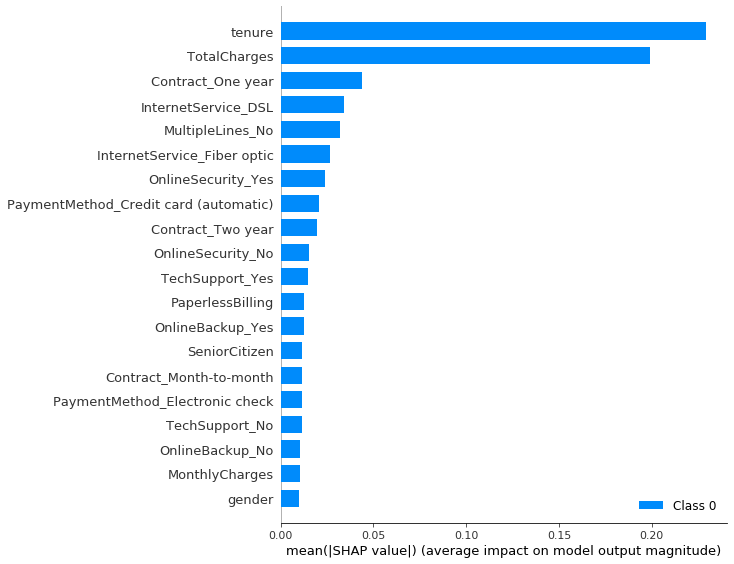

In [318]:
shap.summary_plot(shap_values, X_test)

# Hybrid classifier

In [319]:
from sklearn.ensemble import VotingClassifier
log_clf=LogisticRegression()
rnd_clf = RandomForestClassifier()
svc_clf=SVC()
vot_clf=VotingClassifier(estimators=[('lr', log_clf), ('rnd', rnd_clf),
                                     ('svc', svc_clf)], voting = 'hard')

In [320]:
Hyb_vot_clf = Pipeline([('transformer',ct),
                ('classifier', vot_clf)
               ])

In [321]:
Hyb_vot_clf.fit(X_train_sm,y_train_sm)

C:\Users\hp\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('somename', StandardScaler(),
                                                  ['tenure', 'MonthlyCharges',
                                                   'TotalCharges'])])),
                ('classifier',
                 VotingClassifier(estimators=[('lr', LogisticRegression()),
                                              ('rnd', RandomForestClassifier()),
                                              ('svc', SVC())]))])

In [322]:
y_predict_hyb=Hyb_vot_clf.predict(X_test_sm)

In [323]:
print("Accuracy score:",metrics.accuracy_score(y_test_sm, y_predict_hyb))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_sm,y_predict_hyb,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_sm, y_predict_hyb))

Accuracy score: 0.8602254428341385

 confusion_matrix: 
 [[1351  196]
 [ 238 1320]]
classification_report:
               precision    recall  f1-score   support

           0       0.85      0.87      0.86      1547
           1       0.87      0.85      0.86      1558

    accuracy                           0.86      3105
   macro avg       0.86      0.86      0.86      3105
weighted avg       0.86      0.86      0.86      3105



In [324]:
from sklearn.ensemble import VotingClassifier
log_clf=LogisticRegression()
rnd_clf = RandomForestClassifier()
svc_clf=SVC(probability=True)
vot_clf=VotingClassifier(estimators=[('lr', log_clf), ('rnd', rnd_clf),
                                     ('svc', svc_clf)], voting = 'soft')
Hyb_vot_clf = Pipeline([('transformer',ct),
                ('classifier', vot_clf)
               ])
Hyb_vot_clf.fit(X_train_sm,y_train_sm)
y_predict_hyb=Hyb_vot_clf.predict(X_test_sm)
print("Accuracy score:",metrics.accuracy_score(y_test_sm, y_predict_hyb))
print("\n confusion_matrix: \n",metrics.confusion_matrix(y_test_sm,y_predict_hyb,labels = [0, 1]))
print("classification_report:\n",metrics.classification_report(y_test_sm, y_predict_hyb))

C:\Users\hp\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Accuracy score: 0.8615136876006442

 confusion_matrix: 
 [[1341  206]
 [ 224 1334]]
classification_report:
               precision    recall  f1-score   support

           0       0.86      0.87      0.86      1547
           1       0.87      0.86      0.86      1558

    accuracy                           0.86      3105
   macro avg       0.86      0.86      0.86      3105
weighted avg       0.86      0.86      0.86      3105



In [325]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_sm),
    feature_names=X_train_sm.columns,
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=X_test.iloc[100], 
    predict_fn=Hyb_vot_clf['classifier'].predict_proba
)
exp.show_in_notebook(show_table=True)

In [424]:
exp_Hyb_vot_clf = dx.Explainer(Hyb_vot_clf,x,y)
fobject_Hyb_vot_clf = exp_Hyb_vot_clf.model_fairness(protected = protected_values(x), privileged='maleyoung')
fobject_Hyb_vot_clf.fairness_check(epsilon = 0.8)
exp_Hyb_vot_clf.model_performance()

Preparation of a new explainer is initiated

  -> data              : 7043 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 7043 values
  -> model_class       : sklearn.ensemble._voting.VotingClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0227, mean = 0.312, max = 0.941
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.911, mean = -0.0468, max = 0.959
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 3 metrics: TPR, FPR, STP

Conclusion: your model is not fair because 2 or more 

,recall,precision,f1,accuracy,auc
VotingClassifier,0.686998,0.705107,0.695935,0.840693,0.914952


In [331]:
fobject_Hyb_vot_clf.plot()

In [425]:
exp_Hyb_vot_clf_rus = dx.Explainer(Hyb_vot_clf,X_rus,y_rus)
exp_Hyb_vot_clf_rus.model_performance().result
fobject_Hyb_vot_clf_rus = exp_Hyb_vot_clf_rus.model_fairness(protected = protected_values(X_rus), privileged='maleyoung')
fobject_Hyb_vot_clf_rus.fairness_check(epsilon = 0.8)
fobject_Hyb_vot_clf_rus.metric_scores
fobject_Hyb_vot_clf_rus.plot()
exp_Hyb_vot_clf_rus.model_performance()

Preparation of a new explainer is initiated

  -> data              : 3738 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 3738 values
  -> model_class       : sklearn.ensemble._voting.VotingClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0227, mean = 0.412, max = 0.941
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.896, mean = 0.0882, max = 0.959
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 3 metrics: TPR, FPR, STP

Conclusion: your model is not fair because 2 or more c

,recall,precision,f1,accuracy,auc
VotingClassifier,0.686998,0.870508,0.767943,0.792402,0.915952


In [333]:
exp_Hyb_vot_clf_ros = dx.Explainer(Hyb_vot_clf,X_ros,y_ros)
exp_Hyb_vot_clf_ros.model_performance().result
fobject_Hyb_vot_clf_ros = exp_Hyb_vot_clf_ros.model_fairness(protected = protected_values(X_ros), privileged='maleyoung')
fobject_Hyb_vot_clf_ros.fairness_check(epsilon = 0.8)
fobject_Hyb_vot_clf_ros.metric_scores
fobject_Hyb_vot_clf_ros.plot()

Preparation of a new explainer is initiated

  -> data              : 10348 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10348 values
  -> model_class       : sklearn.ensemble._voting.VotingClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0217, mean = 0.403, max = 0.937
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.906, mean = 0.0968, max = 0.958
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more crit

In [426]:
exp_Hyb_vot_clf_sm = dx.Explainer(Hyb_vot_clf,X_sm,y_sm)
exp_Hyb_vot_clf_sm.model_performance().result
fobject_Hyb_vot_clf_sm = exp_Hyb_vot_clf_sm.model_fairness(protected = protected_values(X_sm), privileged='maleyoung')
fobject_Hyb_vot_clf_sm.fairness_check(epsilon = 0.8)
fobject_Hyb_vot_clf_sm.metric_scores
fobject_Hyb_vot_clf_sm.plot()
exp_Hyb_vot_clf_sm.model_performance()

Preparation of a new explainer is initiated

  -> data              : 10348 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10348 values
  -> model_class       : sklearn.ensemble._voting.VotingClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0227, mean = 0.508, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.911, mean = -0.00824, max = 0.959
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more crit

,recall,precision,f1,accuracy,auc
VotingClassifier,0.868187,0.893219,0.880525,0.882199,0.965041


In [335]:
exp_Hyb_vot_clf_ada = dx.Explainer(Hyb_vot_clf,X_ada,y_ada)
exp_Hyb_vot_clf_ada.model_performance().result
fobject_Hyb_vot_clf_ada = exp_Hyb_vot_clf_ada.model_fairness(protected = protected_values(X_ada), privileged='maleyoung')
fobject_Hyb_vot_clf_ada.fairness_check(epsilon = 0.8)
fobject_Hyb_vot_clf_ada.metric_scores
fobject_Hyb_vot_clf_ada.plot()

Preparation of a new explainer is initiated

  -> data              : 10408 rows 32 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 10408 values
  -> model_class       : sklearn.ensemble._voting.VotingClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x00000219DC586C18> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 0.0217, mean = 0.497, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.906, mean = 0.00631, max = 0.958
  -> model_info        : package sklearn

A new explainer has been created!
Bias detected in 2 metrics: FPR, STP

Conclusion: your model is not fair because 2 or more crite

# comparision

In [452]:
fobject.plot(objects=[fobject_randforest,fobject_logreg,fobject_clf_xgb,fobject_clf_svm,fobject_Hyb_vot_clf])


Found NaN's or 0's for models: {'DecisionTreeClassifier'}
It is advisable to check 'metric_ratios'


In [453]:
fobject.plot(objects=[fobject_randforest,fobject_logreg,fobject_clf_xgb,fobject_clf_svm,fobject_Hyb_vot_clf],
             type='metric_scores')

In [454]:
fobject.plot(objects=[fobject_randforest,fobject_logreg,fobject_clf_xgb,fobject_clf_svm,fobject_Hyb_vot_clf],
             type="performance_and_fairness")

In [455]:
fobject.plot(objects=[fobject_randforest,fobject_logreg,fobject_clf_xgb,fobject_clf_svm,fobject_Hyb_vot_clf],
             type="radar")

In [456]:
fobject.plot(objects=[fobject_randforest,fobject_logreg,fobject_clf_xgb,fobject_clf_svm,fobject_Hyb_vot_clf],
             type="stacked")

In [457]:
fobject.plot(objects=[fobject_randforest,fobject_logreg,fobject_clf_xgb,fobject_clf_svm,fobject_Hyb_vot_clf],
             type="heatmap")

In [458]:
fobject_sm.plot(objects=[fobject_randforest_sm,fobject_logreg_sm,fobject_clf_xgb_sm,fobject_clf_svm_sm,
                         fobject_Hyb_vot_clf_sm],type="performance_and_fairness")

In [459]:
fobject_sm.plot(objects=[fobject_randforest_sm,fobject_logreg_sm,fobject_clf_xgb_sm,fobject_clf_svm_sm,
                         fobject_Hyb_vot_clf_sm],type="radar")

In [460]:
fobject_sm.plot(objects=[fobject_randforest_sm,fobject_logreg_sm,fobject_clf_xgb_sm,fobject_clf_svm_sm,
                         fobject_Hyb_vot_clf_sm],type="heatmap")

In [461]:
fobject_sm.plot(objects=[fobject_randforest_sm,fobject_logreg_sm,fobject_clf_xgb_sm,fobject_clf_svm_sm,
                         fobject_Hyb_vot_clf_sm],type="stacked")

In [462]:
fobject_ros.plot(objects=[fobject_randforest_ros,fobject_clf_xgb_ros,fobject_clf_svm_ros,
                         fobject_Hyb_vot_clf_ros,fobject_logreg_ros],type="performance_and_fairness")

In [463]:
fobject_ros.plot(objects=[fobject_randforest_ros,fobject_clf_xgb_ros,fobject_clf_svm_ros,
                         fobject_Hyb_vot_clf_ros,fobject_logreg_ros],type="radar")

In [464]:
fobject_ros.plot(objects=[fobject_randforest_ros,fobject_clf_xgb_ros,fobject_clf_svm_ros,
                         fobject_Hyb_vot_clf_ros,fobject_logreg_ros],type="stacked")

In [465]:
fobject_rus.plot(objects=[fobject_randforest_rus,fobject_clf_xgb_rus,fobject_clf_svm_rus,
                         fobject_Hyb_vot_clf_rus,fobject_logreg_rus],type="performance_and_fairness")

In [466]:
fobject_rus.plot(objects=[fobject_randforest_rus,fobject_clf_xgb_rus,fobject_clf_svm_rus,
                         fobject_Hyb_vot_clf_rus,fobject_logreg_rus],type="stacked")

In [473]:
fobject_ada.plot(objects=[fobject_randforest_ada,fobject_clf_xgb_ada,fobject_clf_svm_ada,
                         fobject_Hyb_vot_clf_ada,fobject_logreg_ada],type="performance_and_fairness",
                         fairness_metric="FNR",performance_metric="accuracy")

In [468]:
fobject_ada.plot(objects=[fobject_randforest_ada,fobject_clf_xgb_ada,fobject_clf_svm_ada,
                         fobject_Hyb_vot_clf_ada,fobject_logreg_ada],type="stacked")

In [469]:
pd.concat([exp.model_performance().result for exp in [exp_logreg,exp_decision,exp_randforest,exp_clf_svm,exp_clf_xgb,exp_Hyb_vot_clf]])

,recall,precision,f1,accuracy,auc
LogisticRegression,0.593365,0.624437,0.608505,0.797387,0.841177
DecisionTreeClassifier,0.644730,0.607665,0.625649,0.795258,0.753489
RandomForestClassifier,0.767790,0.820000,0.793037,0.893653,0.944540
SVC,0.805243,0.562407,0.662266,0.782053,0.869006
XGBClassifier,0.618513,0.691801,0.653107,0.825642,0.883228
VotingClassifier,0.686998,0.705107,0.695935,0.840693,0.914952


In [470]:
pd.concat([exp.model_performance().result for exp in [exp_logreg_rus,exp_decision_rus,exp_randforest_rus,exp_clf_svm_rus,
                                                      exp_clf_xgb_rus,exp_Hyb_vot_clf_rus]])

,recall,precision,f1,accuracy,auc
LogisticRegression,0.588015,0.824456,0.686446,0.731407,0.843261
DecisionTreeClassifier,0.875869,0.919663,0.897232,0.899679,0.929842
RandomForestClassifier,0.794007,0.928080,0.855825,0.866239,0.949527
SVC,0.805243,0.788784,0.796929,0.794810,0.873090
XGBClassifier,0.813269,0.925137,0.865604,0.873729,0.946856
VotingClassifier,0.686998,0.870508,0.767943,0.792402,0.915952


In [471]:
pd.concat([exp.model_performance().result for exp in [exp_logreg_ros,exp_decision_ros,exp_randforest_ros,exp_clf_svm_ros,
                                                      exp_clf_xgb_ros,exp_Hyb_vot_clf_ros]])

,recall,precision,f1,accuracy,auc
LogisticRegression,0.577696,0.818456,0.677317,0.724778,0.837409
DecisionTreeClassifier,0.635485,0.808657,0.711688,0.742559,0.812138
RandomForestClassifier,0.786046,0.925580,0.850125,0.861422,0.944684
SVC,0.806919,0.780958,0.793726,0.790298,0.872504
XGBClassifier,0.613259,0.860358,0.716091,0.756861,0.880255
VotingClassifier,0.681871,0.883768,0.769801,0.796096,0.926021


In [450]:
pd.concat([exp.model_performance().result for exp in [exp_logreg_sm,exp_decision_sm,exp_randforest_sm,exp_clf_svm_sm,
                                                      exp_clf_xgb_sm,exp_Hyb_vot_clf_sm]])

,recall,precision,f1,accuracy,auc
LogisticRegression,0.828952,0.866115,0.847126,0.850406,0.935858
DecisionTreeClassifier,0.804986,0.842606,0.823367,0.827310,0.857962
RandomForestClassifier,0.894279,0.933993,0.913705,0.915539,0.972088
SVC,0.764206,0.771512,0.767842,0.768941,0.848363
XGBClassifier,0.837457,0.893771,0.864698,0.868960,0.948426
VotingClassifier,0.868187,0.893219,0.880525,0.882199,0.965041


In [451]:
pd.concat([exp.model_performance().result for exp in [exp_logreg_ada,exp_decision_ada,exp_randforest_ada,exp_clf_svm_ada,
                                                      exp_clf_xgb_ada,exp_Hyb_vot_clf_ada]])

,recall,precision,f1,accuracy,auc
LogisticRegression,0.823653,0.866707,0.844632,0.847617,0.935331
DecisionTreeClassifier,0.819450,0.846457,0.832735,0.834454,0.862393
RandomForestClassifier,0.896828,0.934874,0.915456,0.916699,0.972353
SVC,0.688957,0.754867,0.720408,0.731072,0.816422
XGBClassifier,0.823271,0.893427,0.856916,0.861741,0.945702
VotingClassifier,0.866068,0.907144,0.886130,0.888067,0.969276
